In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans
import numpy as np
from sklearn.tree import DecisionTreeRegressor

/Users/frankllonch/anaconda3/envs/datab2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Paso 1: Leer los datos --------------


In [3]:
# Lee el archivo JSON usando pandas (ajusta la ruta si es necesario)
df = pd.read_json('data.json')

# Paso 2: Definir flags para cada columna 

In [4]:
# Mapping para "Profesion": 3 niveles de ingreso
profesion_mapping = {
    'Medico': '2',
    'Ejecutivo': '2',
    'Negocios/empresa': '2',
    'Ingeniero': '1',
    'Funcionario': '1',
    'Servicios': '1',
    'Artista': '0',
    'Construccion': '0',
    'Otros': '0'
}


In [5]:

# Mapping para "Provincia": Agrupación en 4 regiones (Norte, Sur, Este, Oeste)
provincia_mapping = {
    'Segovia': 'Oeste',
    'Alicante': 'Este',
    'Toledo': 'Oeste',
    'Leon': 'Oeste',
    'LLeida': 'Este',
    'Ciudad Real': 'Oeste',
    'i\x81vila': 'Oeste',        # Ávila
    'Guipiºzcoa': 'Norte',       # Guipúzcoa
    'Vizcaya': 'Norte',
    'Orense': 'Norte',
    'Castellon': 'Este',
    'Pontevedra': 'Norte',
    'Almeri\xada': 'Sur',        # Almería
    'Valladolid': 'Oeste',
    'Jaen': 'Sur',
    'Lugo': 'Norte',
    'Santa Cruz de Tenerife': 'Sur',
    'Albacete': 'Oeste',
    'Huelva': 'Sur',
    'Salamanca': 'Oeste',
    'Ceuta': 'Sur',
    'Baleares': 'Este',
    'Gerona': 'Este',
    'Barcelona': 'Este',
    'Sevilla': 'Sur',
    'Guadalajara': 'Oeste',
    'Soria': 'Oeste',
    'Caceres': 'Oeste',
    'Madrid': 'Oeste',
    'Cordoba': 'Sur',
    'Burgos': 'Norte',
    'Cadiz': 'Sur',
    'Navarra': 'Norte',
    'Melilla': 'Sur',
    'Granada': 'Sur',
    'Badajoz': 'Oeste',
    'Valencia': 'Este',
    'Tarragona': 'Este',
    'La Corui±a': 'Norte',      # La Coruña
    'Las Palmas': 'Sur',
    'Murcia': 'Sur',
    'Palencia': 'Oeste',
    'La Rioja': 'Oeste',
    'Teruel': 'Este',
    'Zamora': 'Oeste',
    'Zaragoza': 'Norte',
    'i\x81lava': 'Norte',        # Álava
    'Cuenca': 'Oeste',
    'Huesca': 'Norte',
    'Malaga': 'Sur'
}

In [6]:
# aplicar el mapeo a la columna "Provincia"
df['Provincia'] = df['Provincia'].map(provincia_mapping)

In [7]:
# columns df
columns = df.columns.tolist()
print(columns)

['ID', 'Genero', 'Casado', 'Edad', 'Graduado', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Abandono', 'Dias_cliente', 'Campanna_anno']


In [8]:
# -------------------------------
# 1. Crear Nuevas Transformaciones (Features)
# -------------------------------

# (a) Per Capita Income: Ingresos_anuales_brutos / Family_Size
df['per_capita_income'] = df['Ingresos_anuales_brutos'] / df['Family_Size']

# (b) Client Longevity: Dias_cliente / (Edad + 1)
df['client_longevity'] = df['Dias_cliente'] / (df['Edad'] + 1)

# (c) Socioeconomic Index:
# Primero definimos un mapeo para la Profesión (3 niveles de ingreso)
profesion_mapping_numeric = {
    'Medico': 2, 
    'Ejecutivo': 2, 
    'Negocios/empresa': 2,
    'Ingeniero': 1, 
    'Funcionario': 1, 
    'Servicios': 1,
    'Artista': 0, 
    'Construccion': 0, 
    'Otros': 0
}
df['Profesion_level'] = df['Profesion'].map(profesion_mapping_numeric)

# Gastoscore ya tiene un mapeo: {'Bajo': 0, 'Medio': 1, 'Alto': 2}
gastoscore_mapping = {'Bajo': 0, 'Medio': 1, 'Alto': 2}
df['Gastoscore_numeric'] = df['Gastoscore'].map(gastoscore_mapping)

# Socioeconomic Index es la media de Gastoscore y Profesion_level
df['socioeconomic_index'] = (df['Gastoscore_numeric'] + df['Profesion_level']) / 2

# (d) Marital-Education Interaction: Casado * Graduado (convertidas a 0 y 1)
binary_mapping = {'Si': 1, 'No': 0}
df['Casado_numeric'] = df['Casado'].map(binary_mapping)
df['Graduado_numeric'] = df['Graduado'].map(binary_mapping)
df['marital_education_interaction'] = df['Casado_numeric'] * df['Graduado_numeric']

# FLAGS

In [9]:
# El diccionario define si la columna se incluye y qué codificación aplicar:
# - 'binary' y 'ordinal' requieren un mapeo (se pasa en la clave 'mapping')
# - 'numeric' se procesará a número (además, para Campanna_anno se rellenan NaN y se redondea)
# - 'onehot' se expande a variables dummy y 'label' se codifica con factorize
# Variables ya existentes y nuevas:
col_flags = {
    'Genero':               {'include': True,  'encoding': 'binary',  'mapping': {'F': 1, 'M': 0}},
    'Casado':               {'include': True,  'encoding': 'binary',  'mapping': {'Si': 1, 'No': 0}},
    'Graduado':             {'include': True,  'encoding': 'binary',  'mapping': {'Si': 1, 'No': 0}},
    'Abandono':             {'include': False, 'encoding': 'numeric'},
    'Gastoscore':           {'include': True,  'encoding': 'ordinal','mapping': {'Bajo': 0, 'Medio': 1, 'Alto': 2}},
    'Experiencia_laboral':  {'include': True,  'encoding': 'ordinal','mapping': {'<10annos': 0, '10-20annos': 1, '+20annos': 2}},
    'Campanna_anno':        {'include': False, 'encoding': 'numeric'},
    # Para Profesion usamos onehot en el proceso original, pero ahora añadiremos la transformación extra
    'Profesion':            {'include': True,  'encoding': 'onehot', 'mapping': None},
    'Generacion':           {'include': True,  'encoding': 'ordinal','mapping': {'Generacion X': 0, 'Generacion Z': 1, 'Millennials': 2}},
    'Provincia':            {'include': True,  'encoding': 'onehot'}, 
    'Edad':                 {'include': True,  'encoding': 'numeric'},
    'Family_Size':          {'include': True,  'encoding': 'numeric'},
    'Ingresos_anuales_brutos': {'include': True, 'encoding': 'numeric'},
    'Digital_encuesta':     {'include': False, 'encoding': 'numeric'},
    'Gasto_medio_mensual_cuota': {'include': False, 'encoding': 'numeric'},
    'Dias_cliente':         {'include': True,  'encoding': 'numeric'},
    # Nuevas variables derivadas:
    'per_capita_income':            {'include': True, 'encoding': 'numeric'},
    'client_longevity':             {'include': True, 'encoding': 'numeric'},
    'socioeconomic_index':          {'include': True, 'encoding': 'numeric'},
    'marital_education_interaction':{'include': True, 'encoding': 'numeric'}
}


# Paso 3: Procesar y codificar las variables según los flags 

In [10]:
# Se crea un DataFrame nuevo (processed_df) con todas las columnas procesadas de forma
# automática según la configuración de cada flag.
processed_df = pd.DataFrame()

for col, settings in col_flags.items():
    if settings['include'] and col in df.columns:
        encoding = settings.get('encoding')
        if encoding in ['binary', 'ordinal']:
            # Para variables binarias u ordinales se utiliza el mapeo
            mapping = settings.get('mapping')
            if col in ['Casado', 'Graduado']:  
                # Rellenar valores nulos para estas columnas como 'No' antes de mapear
                processed_df[col] = df[col].fillna('No').map(mapping)
            else:
                processed_df[col] = df[col].map(mapping)
        elif encoding == 'numeric':
            if col == 'Campanna_anno':
                # Para Campanna_anno, rellenar NaN con 0, convertir a numérico, redondear y convertir a entero
                processed_df[col] = pd.to_numeric(df[col].fillna(0), errors='coerce').round().astype(int)
            else:
                processed_df[col] = pd.to_numeric(df[col], errors='coerce')
        elif encoding == 'onehot':
            # Se aplica one-hot encoding y se concatenan las variables dummy al DataFrame
            dummies = pd.get_dummies(df[col], prefix=col, drop_first=False)
            processed_df = pd.concat([processed_df, dummies], axis=1)
        elif encoding == 'label':
            # Codificación label (factorize)
            processed_df[col] = pd.factorize(df[col])[0]
        else:
            # Si no se especifica, se incluye la columna tal cual
            processed_df[col] = df[col]

# (Opcional) Puedes eliminar columnas que no requieras; por ejemplo, si existiera "ID" que no quieras usar:
if 'ID' in processed_df.columns:
    processed_df.drop(columns=['ID'], inplace=True)

# Verificar que las columnas están correctamente procesadas
print("Datos procesados:")
print(processed_df.head())
print(processed_df.dtypes)


Datos procesados:
   Genero  Casado  Graduado  Gastoscore  Experiencia_laboral  \
0       1       1         1           0                    2   
1       0       1         1           1                    2   
2       0       1         1           1                    2   
3       0       0         0           0                    1   
4       0       1         0           1                    2   

   Profesion_Artista  Profesion_Construccion  Profesion_Ejecutivo  \
0              False                   False                False   
1              False                   False                False   
2               True                   False                False   
3              False                   False                False   
4              False                   False                False   

   Profesion_Funcionario  Profesion_Ingeniero  ...  Provincia_Oeste  \
0                  False                 True  ...             True   
1                  False                

# Paso 4: Imputar valores faltantes y escalar los datos 

In [11]:
# Identify binary columns (those with only two unique values, 0 and 1, or booleans) and non-binary columns.
binary_cols = []
non_binary_cols = []

for col in processed_df.columns:
    unique_vals = processed_df[col].dropna().unique()
    # If the column is boolean or contains at most 2 distinct values that are subset of {0,1}
    if processed_df[col].dtype == bool or (len(unique_vals) <= 2 and set(unique_vals).issubset({0, 1})):
        binary_cols.append(col)
    else:
        non_binary_cols.append(col)

print("Binary columns (unchanged):", binary_cols)
print("Non-binary columns (to be scaled):", non_binary_cols)

# Impute and scale non-binary columns
imputer_nb = SimpleImputer(strategy='median')
X_non_binary = imputer_nb.fit_transform(processed_df[non_binary_cols])
scaler = StandardScaler()
X_non_binary_scaled = scaler.fit_transform(X_non_binary)

# Impute binary columns (e.g., fill missing with the most frequent value) but do not scale them.
imputer_bin = SimpleImputer(strategy='most_frequent')
X_binary = imputer_bin.fit_transform(processed_df[binary_cols])

# Combine the scaled non-binary data with the binary data horizontally.
X_combined = np.hstack([X_non_binary_scaled, X_binary])
final_columns = non_binary_cols + binary_cols

# Create the final DataFrame that we'll call X_scaled
X_scaled = pd.DataFrame(X_combined, columns=final_columns)

# Display the first few rows of the resulting DataFrame
print(X_scaled.head())

Binary columns (unchanged): ['Genero', 'Casado', 'Graduado', 'Profesion_Artista', 'Profesion_Construccion', 'Profesion_Ejecutivo', 'Profesion_Funcionario', 'Profesion_Ingeniero', 'Profesion_Medico', 'Profesion_Negocios/empresa', 'Profesion_Otros', 'Profesion_Servicios', 'Provincia_Este', 'Provincia_Norte', 'Provincia_Oeste', 'Provincia_Sur', 'marital_education_interaction']
Non-binary columns (to be scaled): ['Gastoscore', 'Experiencia_laboral', 'Generacion', 'Edad', 'Family_Size', 'Ingresos_anuales_brutos', 'Dias_cliente', 'per_capita_income', 'client_longevity', 'socioeconomic_index']
   Gastoscore  Experiencia_laboral  Generacion      Edad  Family_Size  \
0   -0.731429             0.775758   -1.020152  1.035176     0.152186   
1    0.621270             0.775758   -1.020152  0.872409    -0.493738   
2    0.621270             0.775758   -1.020152  0.926665     0.152186   
3   -0.731429            -0.470020    1.190348 -0.809517     0.798110   
4    0.621270             0.775758   -1.0

#  Paso 5: Aplicar PCA 

In [12]:
n_components = 2  # Número de componentes principales
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i}' for i in range(1, n_components+1)])

# Mostrar la varianza explicada por cada componente
varianza_explicada = pca.explained_variance_ratio_
print("Varianza explicada por cada PC:")
for i, var in enumerate(varianza_explicada, start=1):
    print(f"PC{i}: {var*100:.2f}%")

Varianza explicada por cada PC:
PC1: 32.41%
PC2: 16.00%


#  Paso 6: Graficar resultados del PCA 


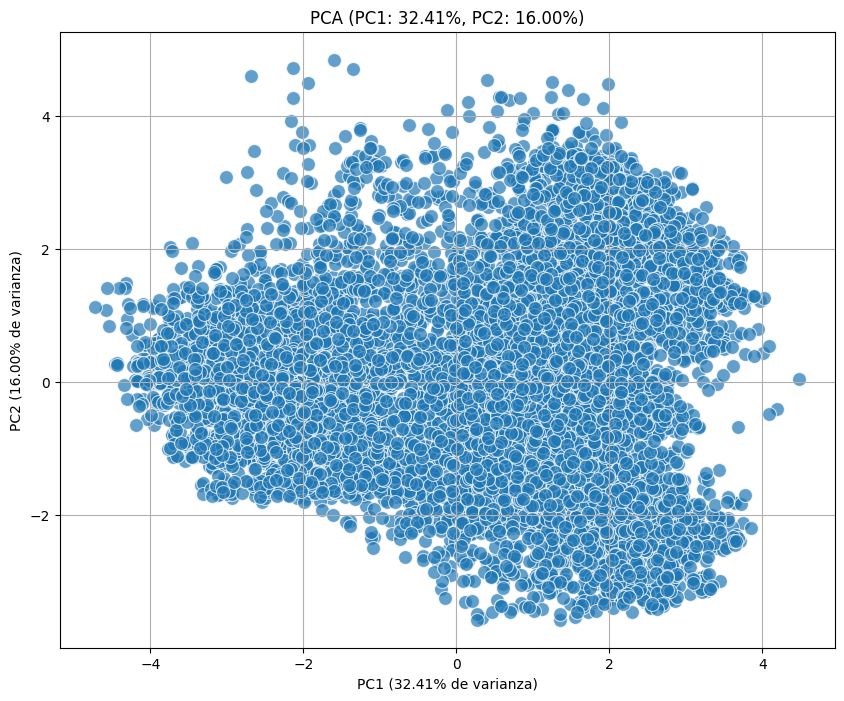

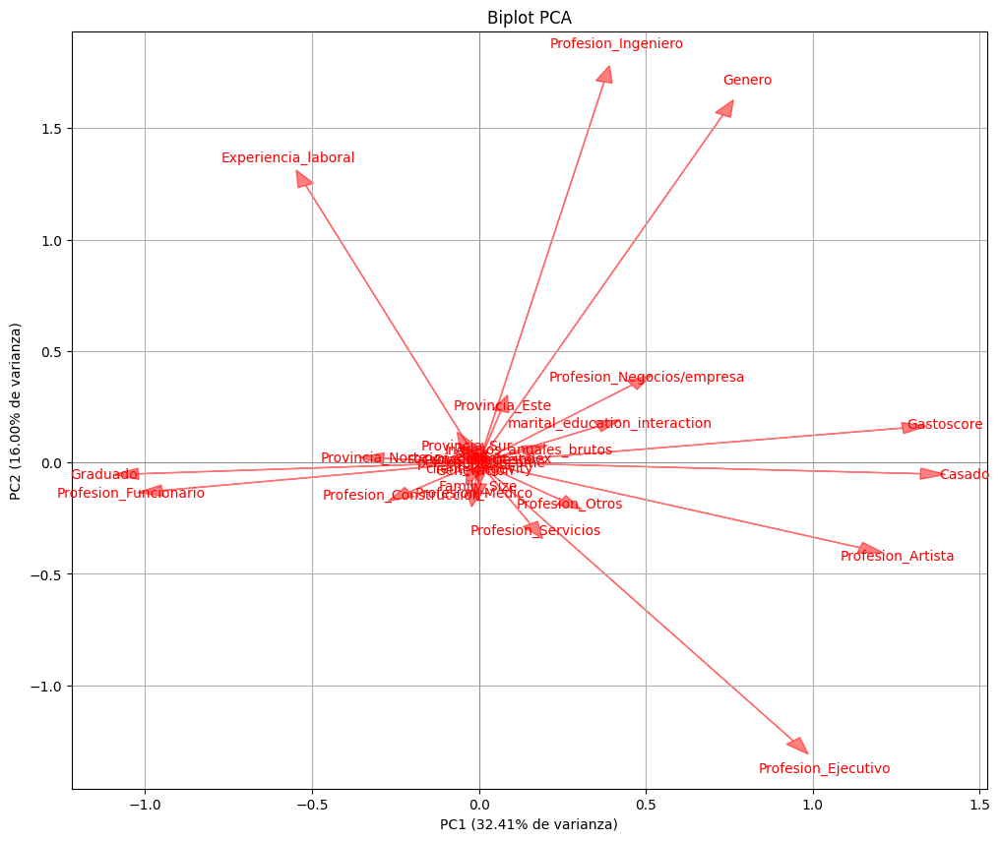

In [13]:
plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, s=100, alpha=0.7)
plt.title(f'PCA (PC1: {varianza_explicada[0]*100:.2f}%, PC2: {varianza_explicada[1]*100:.2f}%)')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% de varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% de varianza)')
plt.grid(True)
plt.show()

# Biplot: visualizar cómo contribuyen las variables originales a las PC
plt.figure(figsize=(12,10))
variables = processed_df.columns.tolist()
cargas = pca.components_.T
factor = 3  # Factor para escalar las flechas
for i, var in enumerate(variables):
    plt.arrow(0, 0, cargas[i, 0]*factor, cargas[i, 1]*factor,
              color='r', alpha=0.5, head_width=0.05)
    plt.text(cargas[i, 0]*factor*1.1, cargas[i, 1]*factor*1.1, var, 
             color='r', ha='center', va='center')
plt.title('Biplot PCA')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% de varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% de varianza)')
plt.axhline(0, color='grey', linewidth=0.5)
plt.axvline(0, color='grey', linewidth=0.5)
plt.grid(True)
plt.show()

#  Paso 7: Clustering sobre los resultados del PCA 


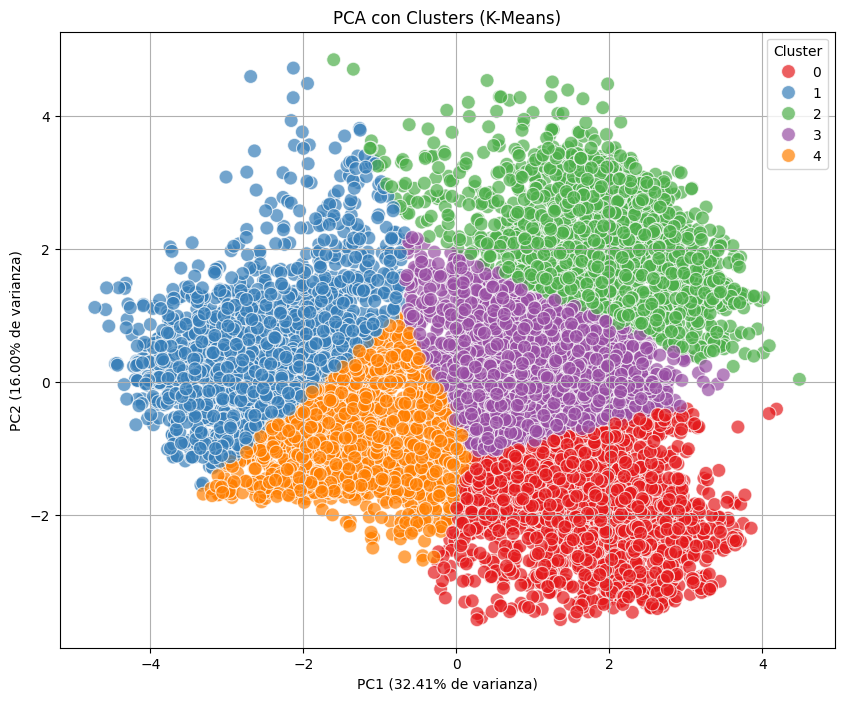

In [14]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(pca_df)
pca_df['Cluster'] = clusters

plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='Set1', s=100, alpha=0.7)
plt.title('PCA con Clusters (K-Means)')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% de varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% de varianza)')
plt.grid(True)
plt.show()

In [15]:
from sklearn.metrics import silhouette_score
score = silhouette_score(X_scaled, clusters)  # X_scaled is your data used for clustering
print("Silhouette Score:", score)
from sklearn.metrics import davies_bouldin_score
db_index = davies_bouldin_score(X_scaled, clusters)
print("Davies-Bouldin Index:", db_index)
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(X_scaled, clusters)
print("Calinski-Harabasz Score:", ch_score)

Silhouette Score: 0.11678026335732865
Davies-Bouldin Index: 2.349646532016576
Calinski-Harabasz Score: 1972.671556804318


## Desglose


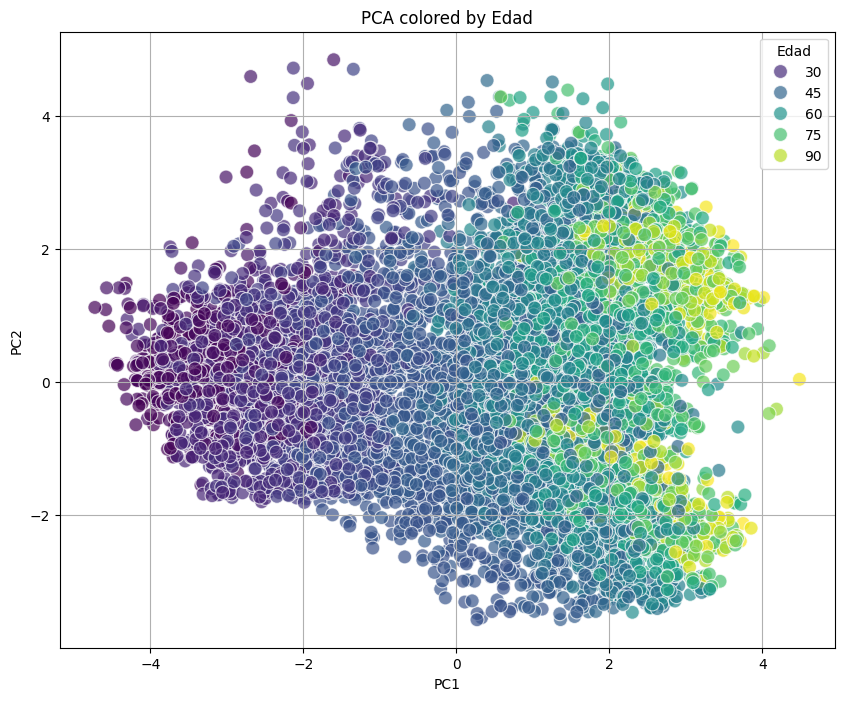

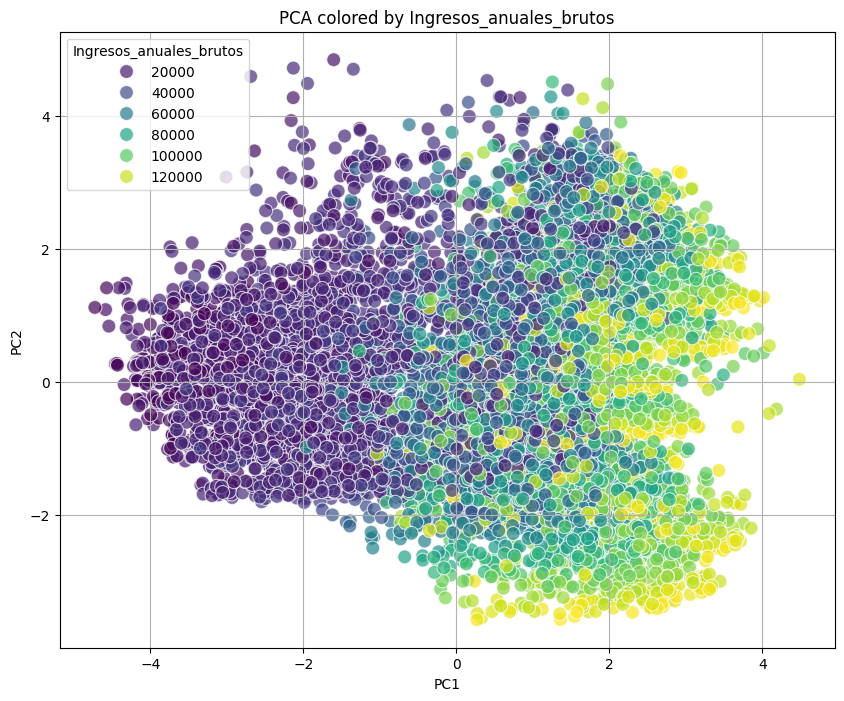

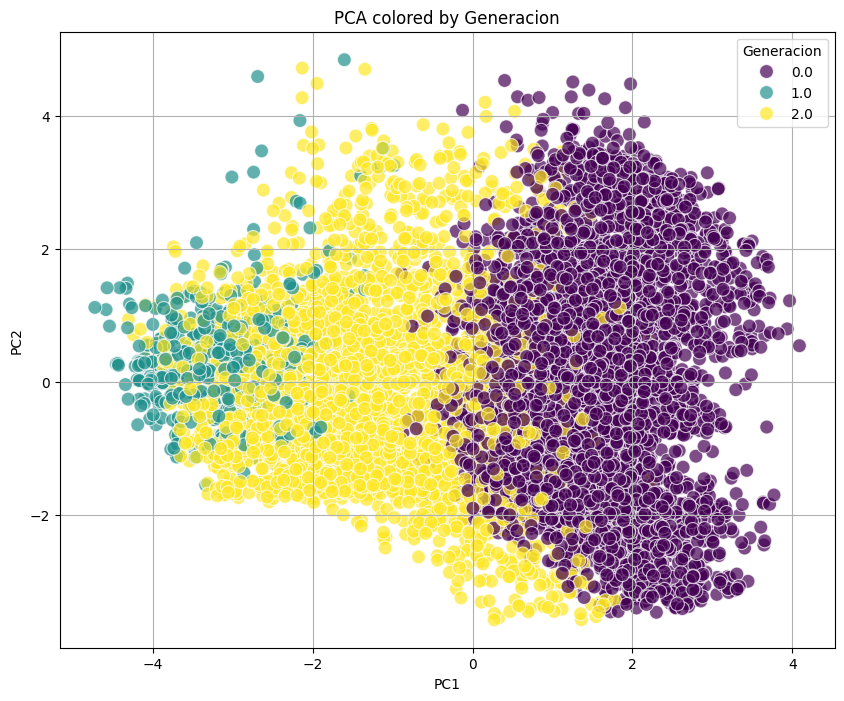

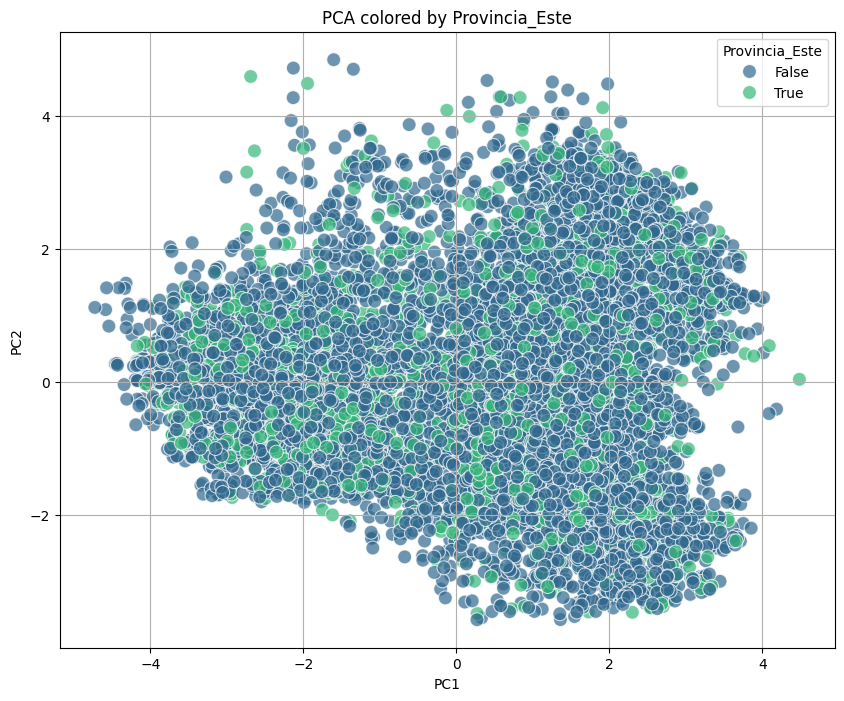

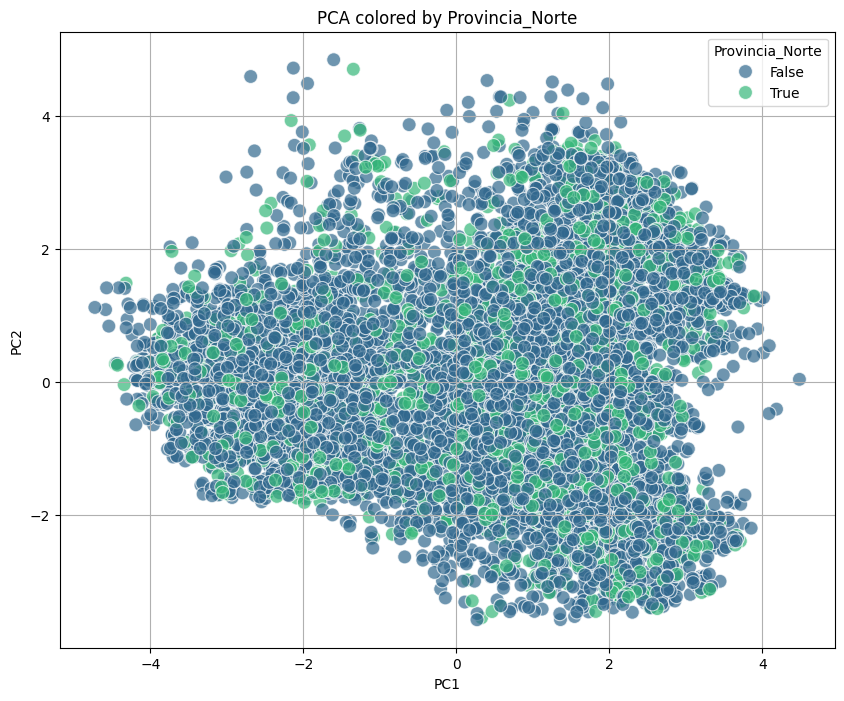

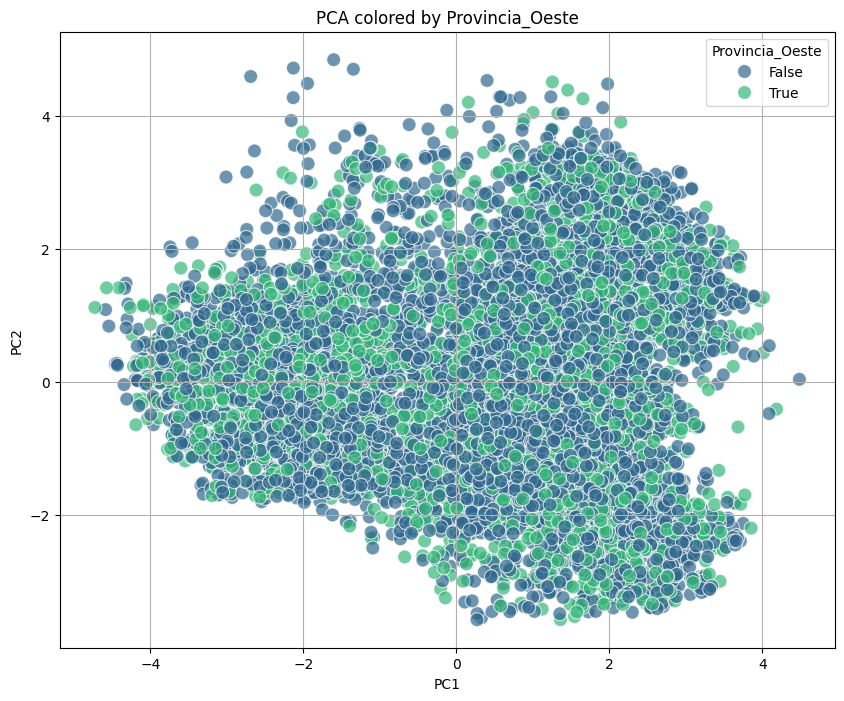

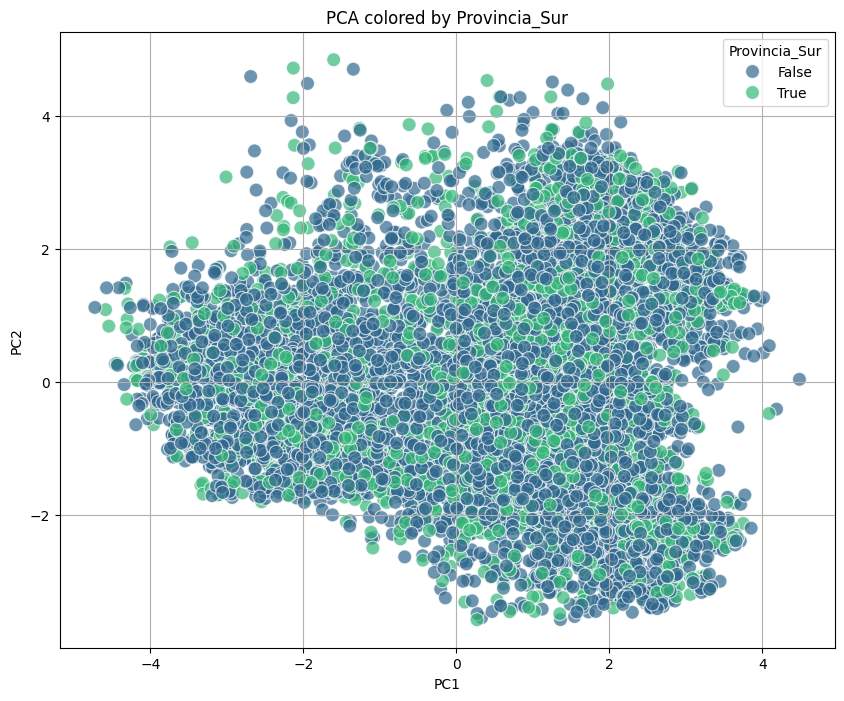

In [16]:

# Define key variables to analyze
key_variables = ['Edad', 'Ingresos_anuales_brutos', 'Generacion',
                 'Provincia_Este', 'Provincia_Norte', 'Provincia_Oeste', 'Provincia_Sur']

# Make sure pca_df is your PCA results DataFrame, for example, with columns "PC1", "PC2", and (optionally) "Cluster"
# And processed_df is your original processed DataFrame (after applying your flag-based processing)

for var in key_variables:
    if var in processed_df.columns:
        # Create a temporary DataFrame joining the PCA results and the key variable from the original data
        temp_df = pca_df.copy()
        temp_df[var] = processed_df[var].values
        
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x="PC1", y="PC2", hue=var, data=temp_df, palette="viridis", s=100, alpha=0.7)
        plt.title(f'PCA colored by {var}')
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.grid(True)
        plt.show()
    else:
        print(f"Variable {var} not found in processed_df.")

Clustering evaluation on original scaled data:
Silhouette Score: 0.15889556645227912
Davies-Bouldin Index: 1.9540106095519394
Calinski-Harabasz Score: 2262.060971486493

Numerical Summary per Cluster:
         Edad_min  Edad_median  Edad_mean  Edad_max  \
Cluster                                               
0              40         52.0  57.416815        98   
1              20         33.0  32.255118        56   
2              40         55.0  56.997250        98   
3              28         64.0  64.914823        98   
4              20         30.0  29.974194        45   

         socioeconomic_index_median  socioeconomic_index_mean  \
Cluster                                                         
0                               0.0                  0.302546   
1                               0.5                  0.510630   
2                               0.5                  0.453592   
3                               1.5                  1.545631   
4                      

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/1877307614.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Edad', data=processed_df, palette='Pastel1')


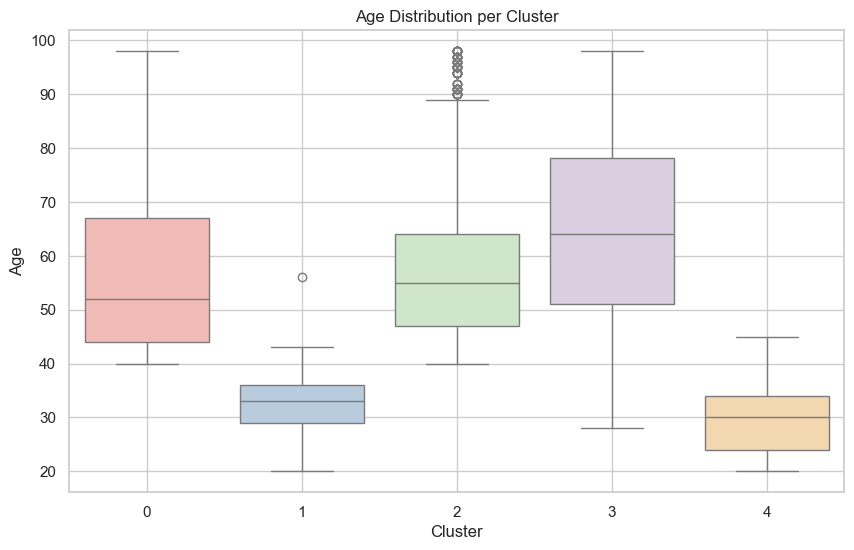

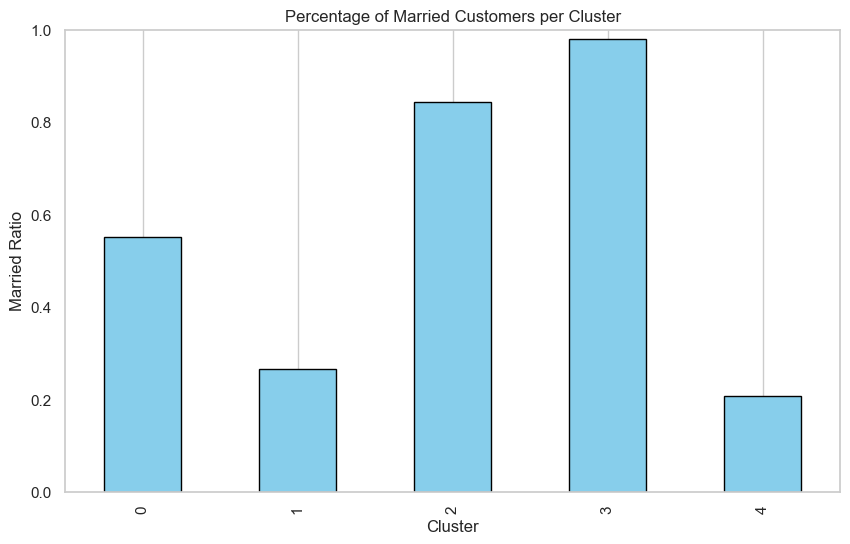

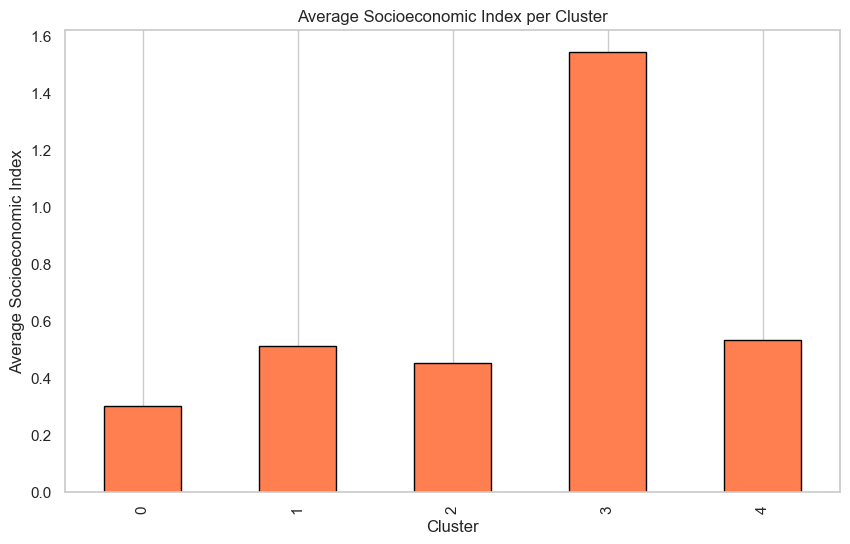

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/1877307614.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=processed_df, palette='Pastel2')


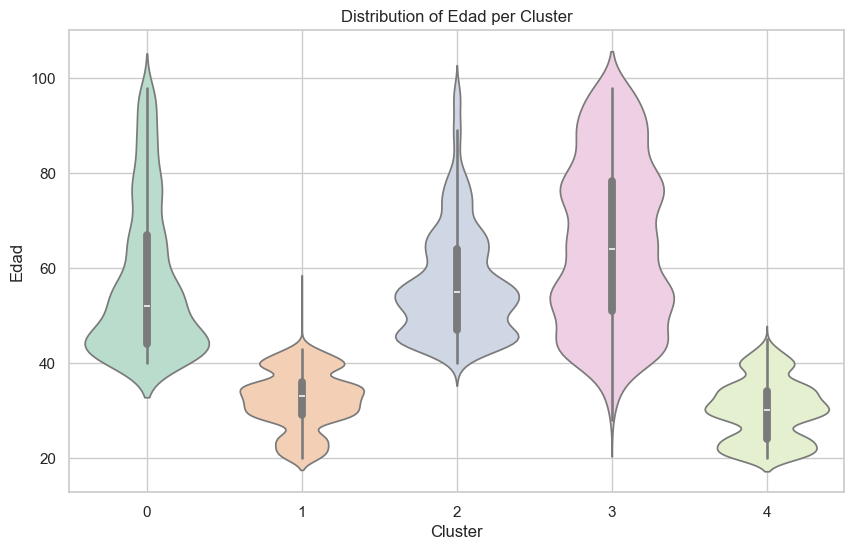

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/1877307614.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=processed_df, palette='Pastel2')


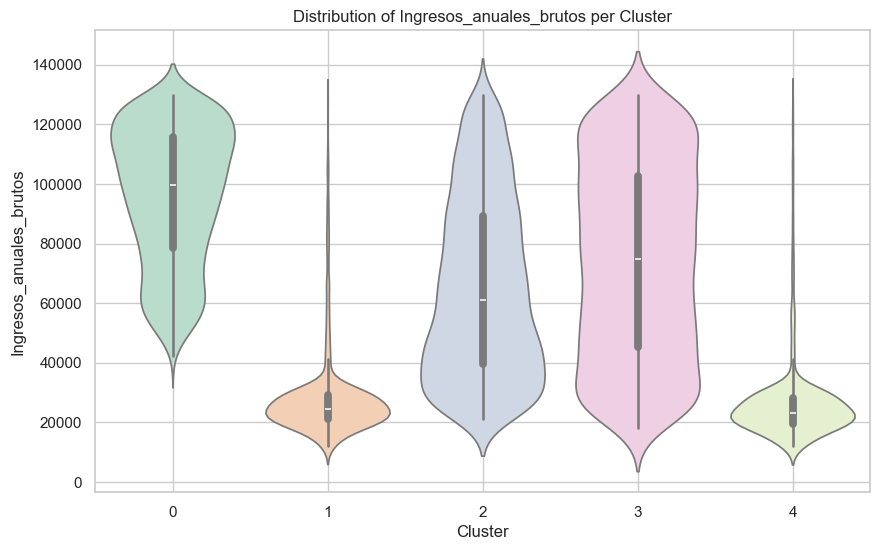

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/1877307614.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=processed_df, palette='Pastel2')


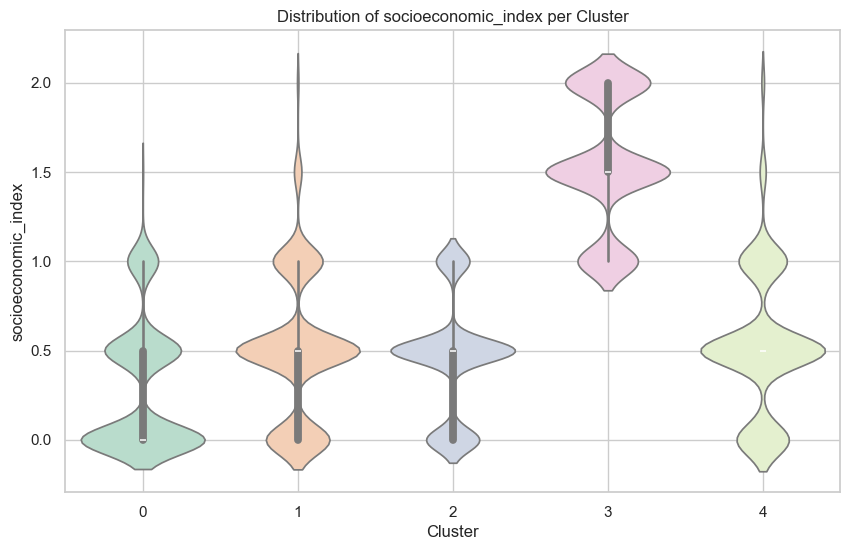

In [17]:
# ------------------------------
# 1. Clustering and Assigning Cluster Labels to processed_df
# ------------------------------
# Assume X_scaled is already computed from processed_df (your numeric/processed data).
# Make sure that the order (the index) of X_scaled matches that of processed_df.

# Run KMeans clustering with 5 clusters (adjust random_state as needed)
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Add the cluster labels to processed_df
processed_df['Cluster'] = clusters

# (Optional) Evaluate clustering on the original scaled space:
sil = silhouette_score(X_scaled, clusters)
db_index = davies_bouldin_score(X_scaled, clusters)
ch_score = calinski_harabasz_score(X_scaled, clusters)

print("Clustering evaluation on original scaled data:")
print("Silhouette Score:", sil)
print("Davies-Bouldin Index:", db_index)
print("Calinski-Harabasz Score:", ch_score)

# ------------------------------
# 2. Numerical Summaries per Cluster
# ------------------------------
# For example, to get age range and social status profile, assuming:
# - 'Edad' is age,
# - 'socioeconomic_index' is your socioeconomic composite,
# - 'Casado' (binary: 1 for married, 0 for not)
# - 'Graduado' (binary: 1 for graduated, 0 for not)
cluster_summary = processed_df.groupby('Cluster').agg({
    'Edad': ['min', 'median', 'mean', 'max'],
    'socioeconomic_index': ['median', 'mean'],
    'Casado': lambda x: (x==1).mean(),   # fraction married
    'Graduado': lambda x: (x==1).mean()    # fraction graduated
})

# Flatten MultiIndex columns for readability
cluster_summary.columns = ['_'.join(col) for col in cluster_summary.columns]
print("\nNumerical Summary per Cluster:")
print(cluster_summary)

# ------------------------------
# 3. Visualizing Cluster Profiles
# ------------------------------
sns.set(style="whitegrid", rc={'figure.figsize':(10, 6)})

# -- Age Distribution per Cluster --
plt.figure()
sns.boxplot(x='Cluster', y='Edad', data=processed_df, palette='Pastel1')
plt.title("Age Distribution per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Age")
plt.grid(True)
plt.show()

# -- Marital Status: Fraction Married per Cluster --
# Here we compute the fraction (or percentage) of 'Casado' == 1 for each cluster.
married_ratio = processed_df.groupby('Cluster')['Casado'].apply(lambda x: (x==1).mean())
plt.figure()
married_ratio.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Percentage of Married Customers per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Married Ratio")
plt.ylim(0,1)
plt.grid(axis='y')
plt.show()

# -- Socioeconomic Index per Cluster --
socioeconomic_mean = processed_df.groupby('Cluster')['socioeconomic_index'].mean()
plt.figure()
socioeconomic_mean.plot(kind='bar', color='coral', edgecolor='black')
plt.title("Average Socioeconomic Index per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Socioeconomic Index")
plt.grid(axis='y')
plt.show()

# ------------------------------
# 4. Visualizing Additional Trends per Cluster (Optional)
# ------------------------------
# For example, you might want to visualize the distribution of another key variable.
key_variables = ['Edad', 'Ingresos_anuales_brutos', 'socioeconomic_index']

for var in key_variables:
    if var in processed_df.columns:
        plt.figure()
        sns.violinplot(x='Cluster', y=var, data=processed_df, palette='Pastel2')
        plt.title(f"Distribution of {var} per Cluster")
        plt.xlabel("Cluster")
        plt.ylabel(var)
        plt.grid(True)
        plt.show()

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/152709106.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')


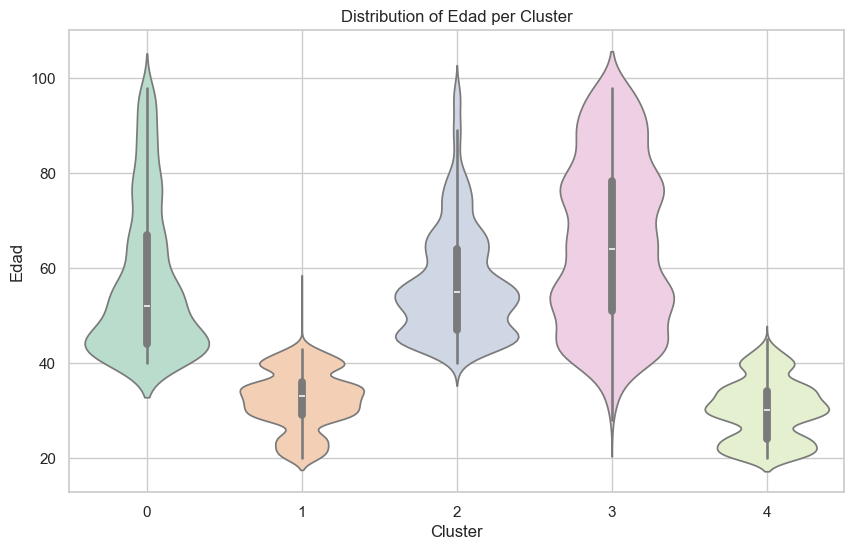

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/152709106.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')


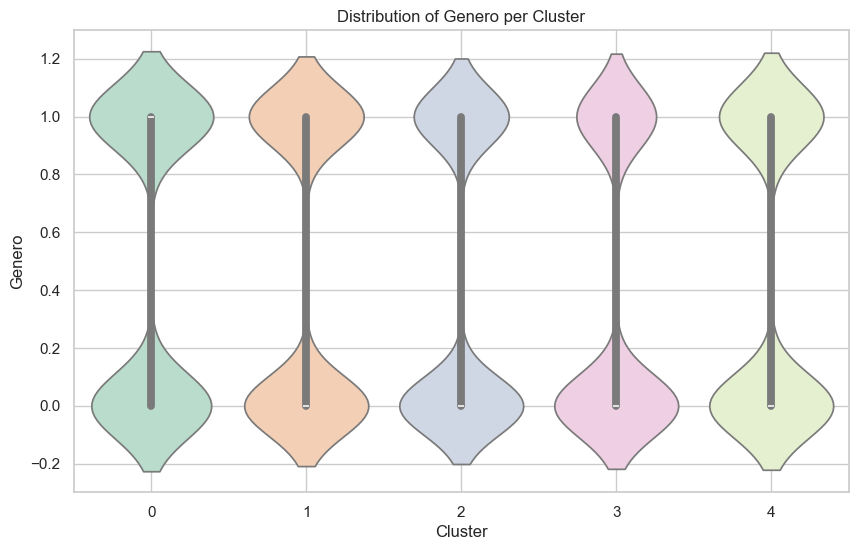

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/152709106.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')


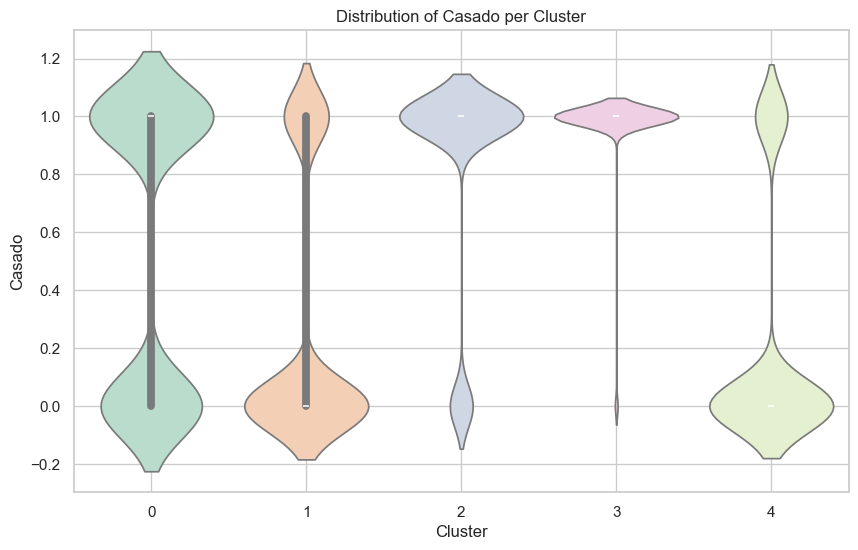

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/152709106.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')


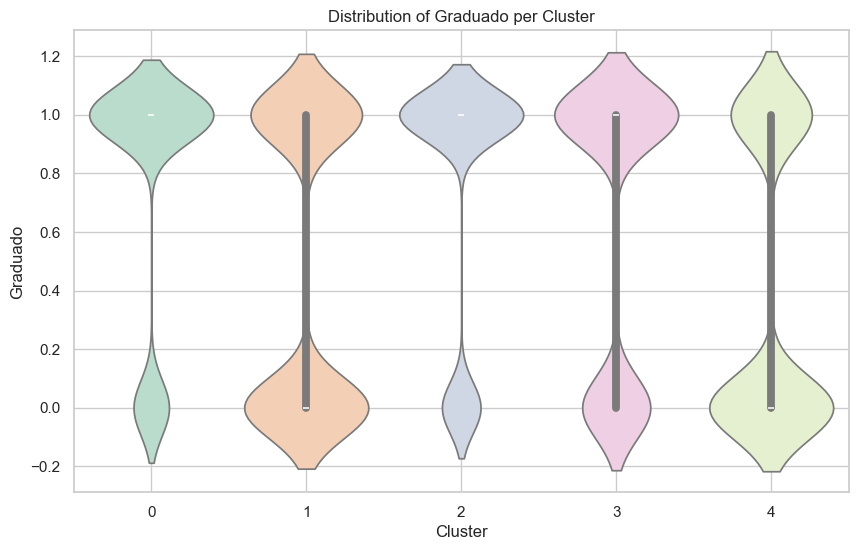

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/152709106.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')


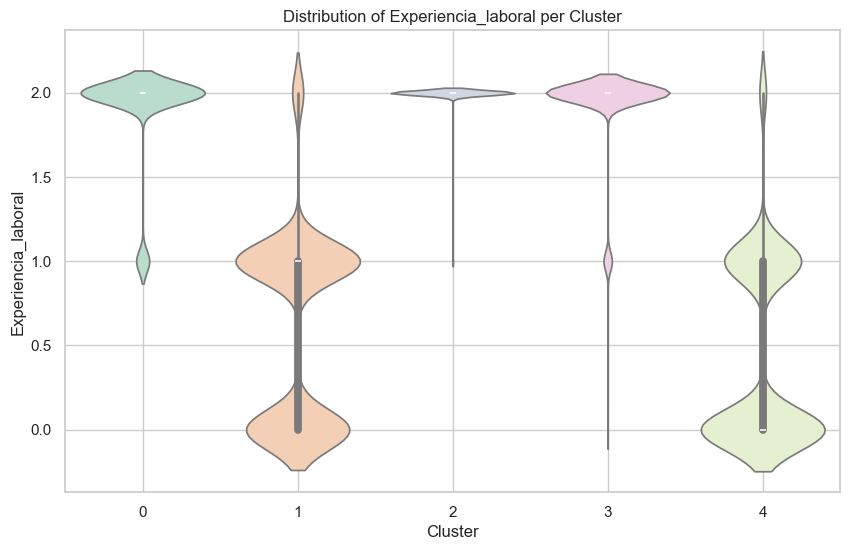

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/152709106.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')


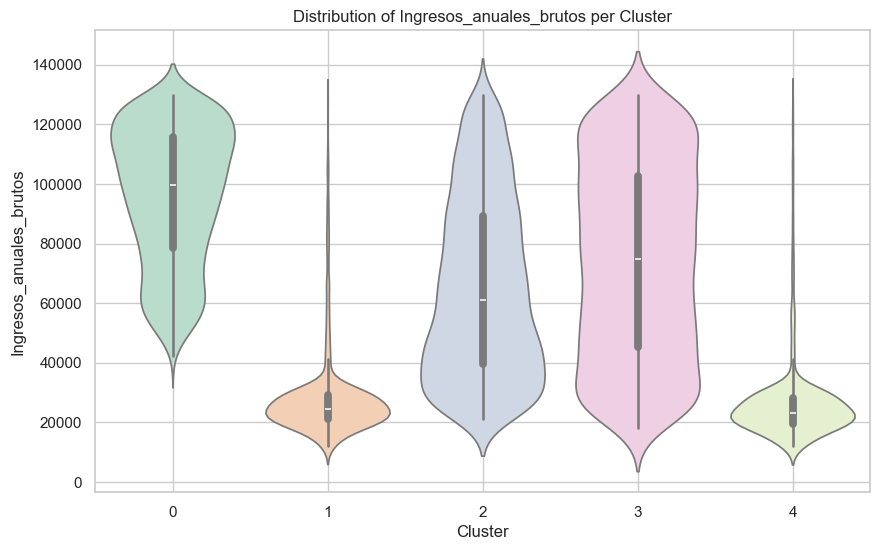

Family_size is not found in the DataFrame.


In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define a function to plot the distribution of a given variable by cluster.
def plot_distribution_by_cluster(df, var, plot_type='violin'):
    """
    Visualizes the distribution of a given variable 'var' across clusters in df.
    
    Parameters:
        df (DataFrame): DataFrame that must contain a 'Cluster' column and the variable.
        var (str): The variable to plot.
        plot_type (str): Type of plot to use ('violin' or 'box'). Default is 'violin'.
    """
    plt.figure(figsize=(10,6))
    
    if plot_type.lower() == 'violin':
        sns.violinplot(x='Cluster', y=var, data=df, palette='Pastel2')
    elif plot_type.lower() == 'box':
        sns.boxplot(x='Cluster', y=var, data=df, palette='Pastel1')
    else:
        # fallback: histogram with a separate color for clusters
        sns.histplot(data=df, x=var, hue='Cluster', multiple='dodge', palette='Set2')
    
    plt.title(f"Distribution of {var} per Cluster")
    plt.xlabel("Cluster")
    plt.ylabel(var)
    plt.grid(True)
    plt.show()


# If you have a list of key variables, you can loop through them:
key_variables = ['Edad', 'Genero', 'Casado', 'Graduado', 'Experiencia_laboral','Ingresos_anuales_brutos', 'Family_size']
for var in key_variables:
    if var in processed_df.columns:
        plot_distribution_by_cluster(processed_df, var, plot_type='violin')
    else:
        print(f"{var} is not found in the DataFrame.")

## feature importance

Number of features used in PCA: 27
Number of features in your original list: 28
Mismatch detected: Using only the first 27 features from processed_df for feature importance.

Feature importance in PC1:
Casado                           0.440789
Gastoscore                       0.422909
Profesion_Artista                0.380382
Graduado                         0.340033
Profesion_Funcionario            0.316172
Profesion_Ejecutivo              0.313722
Genero                           0.243533
Experiencia_laboral              0.172838
Profesion_Negocios/empresa       0.152794
Profesion_Ingeniero              0.124911
marital_education_interaction    0.118606
Provincia_Norte                  0.095004
Profesion_Otros                  0.082094
Profesion_Construccion           0.069585
Profesion_Servicios              0.051283
Ingresos_anuales_brutos          0.045020
Provincia_Este                   0.021725
Provincia_Sur                    0.010970
Edad                             0.006607


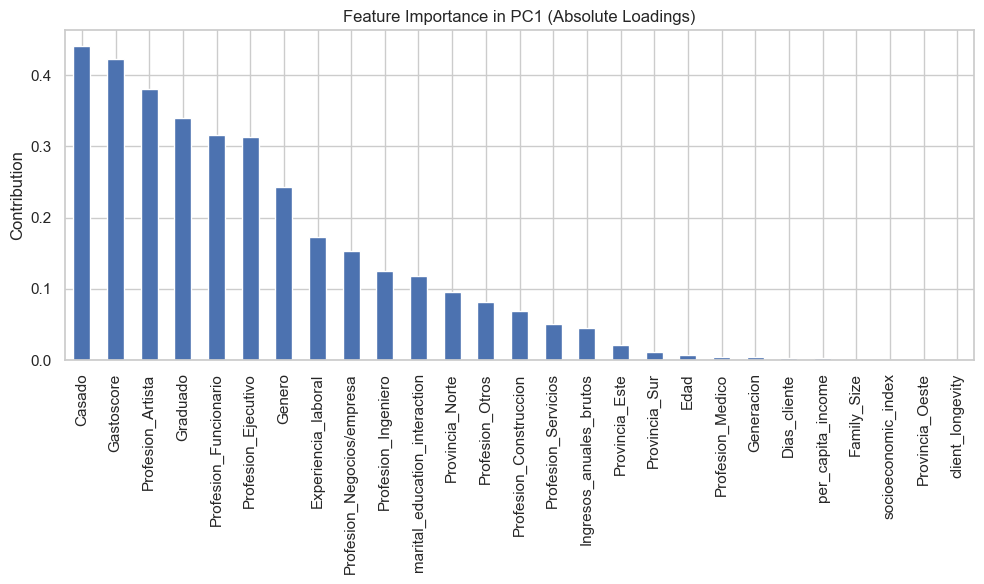


Feature importance in PC2:
Profesion_Ingeniero              0.569164
Genero                           0.519776
Profesion_Ejecutivo              0.416366
Experiencia_laboral              0.414248
Profesion_Artista                0.127421
Profesion_Negocios/empresa       0.115824
Profesion_Servicios              0.092002
Provincia_Este                   0.076752
Profesion_Otros                  0.056389
marital_education_interaction    0.053743
Gastoscore                       0.051487
Profesion_Construccion           0.044200
Profesion_Funcionario            0.041991
Profesion_Medico                 0.041532
Family_Size                      0.032070
Provincia_Sur                    0.022659
Graduado                         0.017016
Ingresos_anuales_brutos          0.016914
Casado                           0.016818
Generacion                       0.011058
Edad                             0.008984
client_longevity                 0.007978
Provincia_Norte                  0.006067
socioe

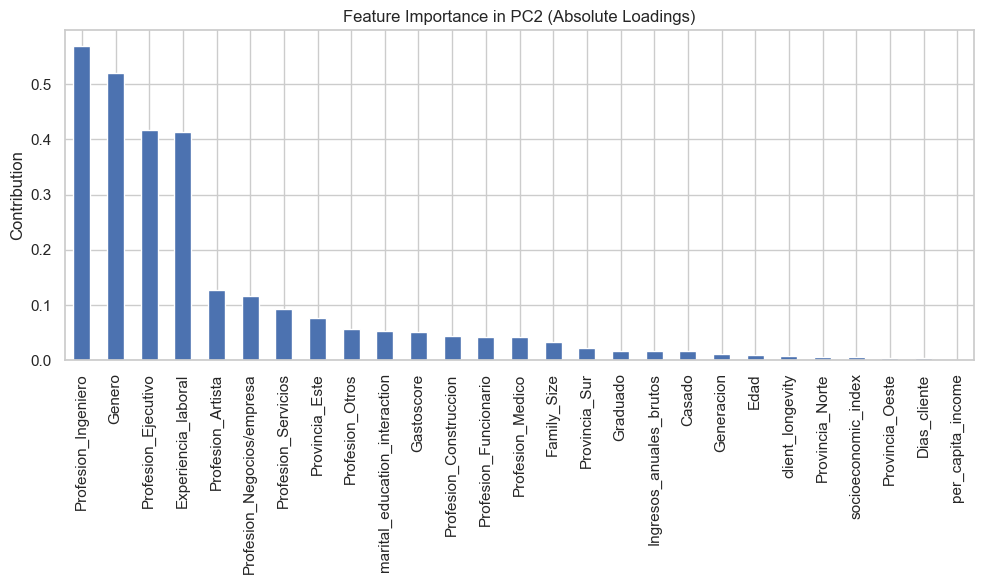

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Get the list of feature names from processed_df.
# (Assuming processed_df is your DataFrame containing the original features used for scaling.)
if isinstance(processed_df, pd.DataFrame):
    feature_names = processed_df.columns.tolist()
else:
    print("processed_df is not a DataFrame. Check your data!")
    feature_names = []

# 2. Extract the loadings from the PCA.
# pca.components_.T should have shape (n_features_used, n_components)
loadings = pca.components_.T
n_features_pca = loadings.shape[0]

print("Number of features used in PCA:", n_features_pca)
print("Number of features in your original list:", len(feature_names))

# 3. If there is a mismatch, trim the feature_names list.
if len(feature_names) > n_features_pca:
    print("Mismatch detected: Using only the first", n_features_pca, "features from processed_df for feature importance.")
    feature_names = feature_names[:n_features_pca]
elif len(feature_names) < n_features_pca:
    print("Warning: processed_df has fewer features than were used in PCA. Proceeding with the available feature names.")

# 4. Create a DataFrame for the PCA loadings using the synchronized feature names.
n_components = loadings.shape[1]
pc_labels = [f'PC{i+1}' for i in range(n_components)]
loadings_df = pd.DataFrame(loadings, index=feature_names, columns=pc_labels)

# 5. Compute the absolute values of the loadings for feature importance and plot them.
loadings_abs = loadings_df.abs()

for pc in pc_labels:
    importance = loadings_abs[pc].sort_values(ascending=False)
    print(f"\nFeature importance in {pc}:")
    print(importance)
    
    plt.figure(figsize=(10, 6))
    importance.plot(kind='bar')
    plt.title(f'Feature Importance in {pc} (Absolute Loadings)')
    plt.ylabel('Contribution')
    plt.tight_layout()
    plt.show()

# Paso 8: Aplicar t-SNE 


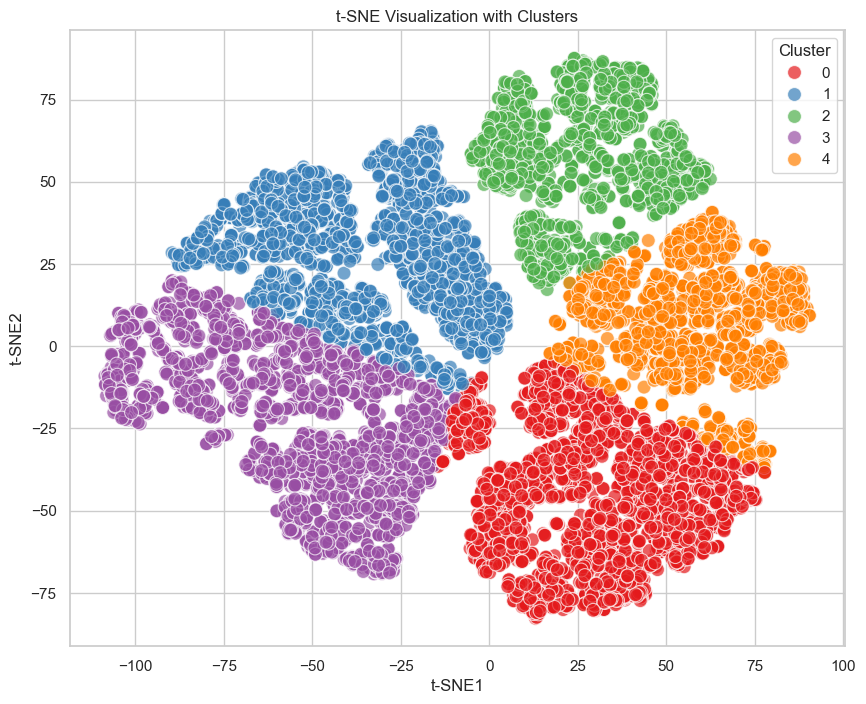

In [20]:

# ==============================
# 1. t-SNE Transformation and Clustering
# ==============================

# Apply t-SNE on X_scaled (make sure X_scaled is a DataFrame)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(data=tsne_results, columns=["tSNE1", "tSNE2"])

# Perform KMeans clustering on the t-SNE results (target 5 clusters)
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(tsne_df[["tSNE1", "tSNE2"]])
tsne_df["Cluster"] = clusters

# Visualize t-SNE with clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x="tSNE1", y="tSNE2", hue="Cluster", data=tsne_df, palette="Set1", s=100, alpha=0.7)
plt.title("t-SNE Visualization with Clusters")
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.grid(True)
plt.show()

In [21]:
# Compute clustering evaluation metrics on the TSNE space
sil_score_tsne = silhouette_score(tsne_df[["tSNE1", "tSNE2"]], clusters)
db_index_tsne = davies_bouldin_score(tsne_df[["tSNE1", "tSNE2"]], clusters)
ch_score_tsne = calinski_harabasz_score(tsne_df[["tSNE1", "tSNE2"]], clusters)

print("\nClustering metrics on t-SNE space:")
print("Silhouette Score:", sil_score_tsne)
print("Davies-Bouldin Index:", db_index_tsne)
print("Calinski-Harabasz Score:", ch_score_tsne)


Clustering metrics on t-SNE space:
Silhouette Score: 0.37917998
Davies-Bouldin Index: 0.9041395476678016
Calinski-Harabasz Score: 10381.796


In [22]:
# ---------------------------
# 4. (Optional) Clustering Evaluation on Original Scaled Data
# ---------------------------
# You may also want to compare clustering performance in the full feature space.
kmeans_orig = KMeans(n_clusters=5, random_state=42)
clusters_orig = kmeans_orig.fit_predict(X_scaled)
sil_score_orig = silhouette_score(X_scaled, clusters_orig)
db_index_orig = davies_bouldin_score(X_scaled, clusters_orig)
ch_score_orig = calinski_harabasz_score(X_scaled, clusters_orig)

print("\nClustering metrics on Original Scaled Data:")
print("Silhouette Score:", sil_score_orig)
print("Davies-Bouldin Index:", db_index_orig)
print("Calinski-Harabasz Score:", ch_score_orig)


Clustering metrics on Original Scaled Data:
Silhouette Score: 0.15889556645227912
Davies-Bouldin Index: 1.9540106095519394
Calinski-Harabasz Score: 2262.060971486493


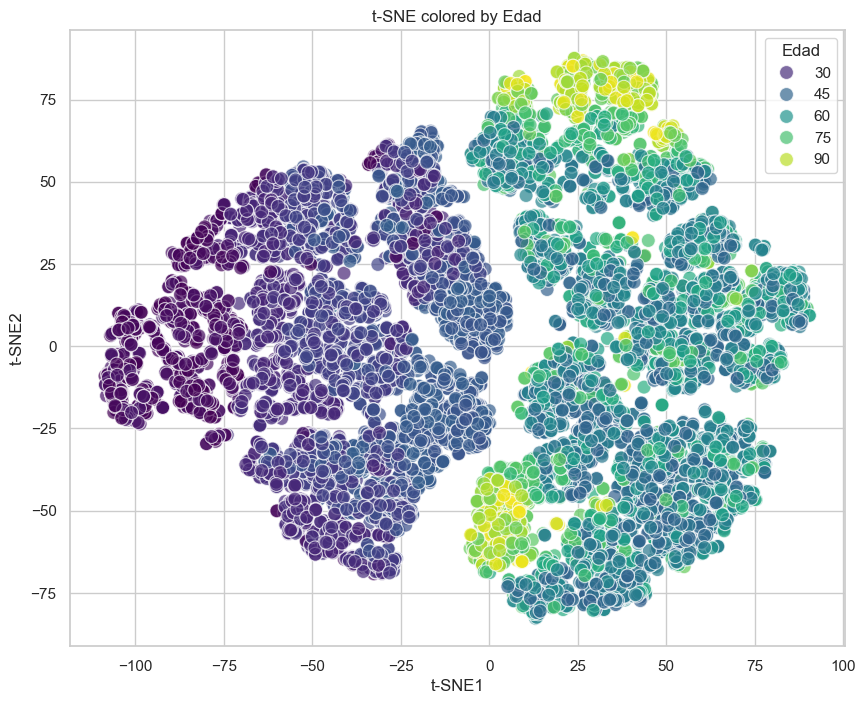

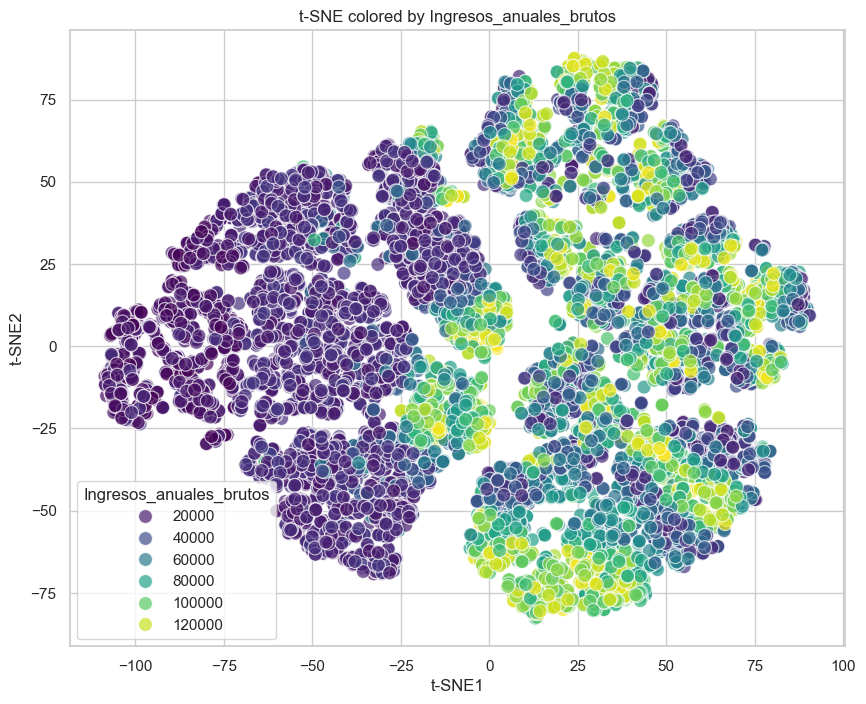

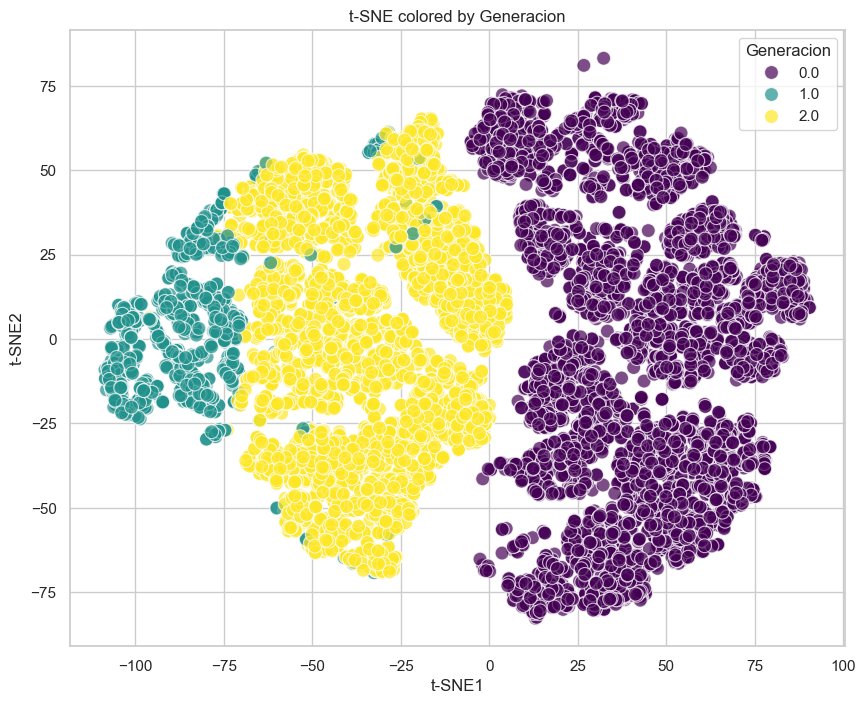

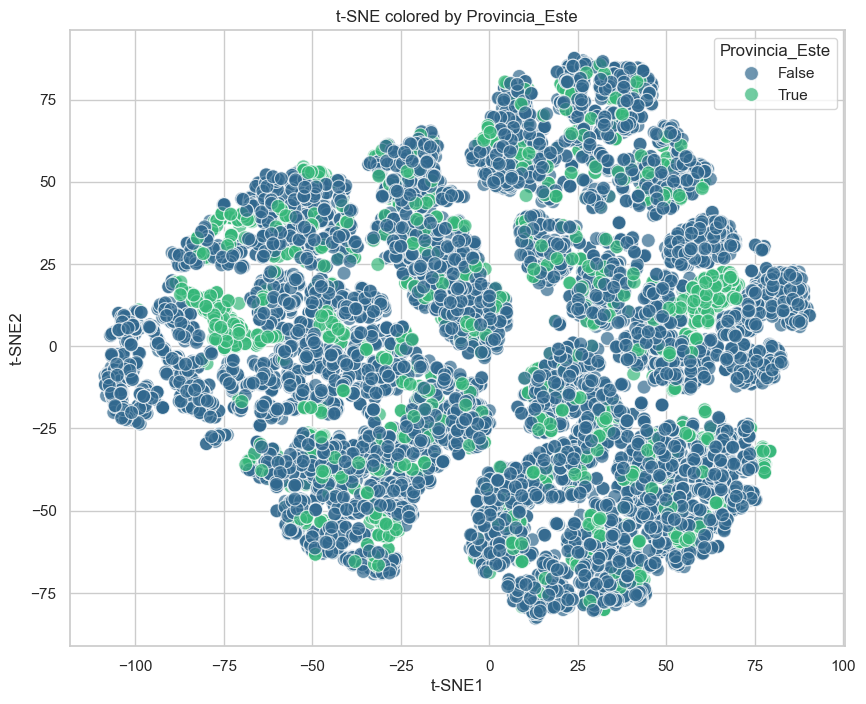

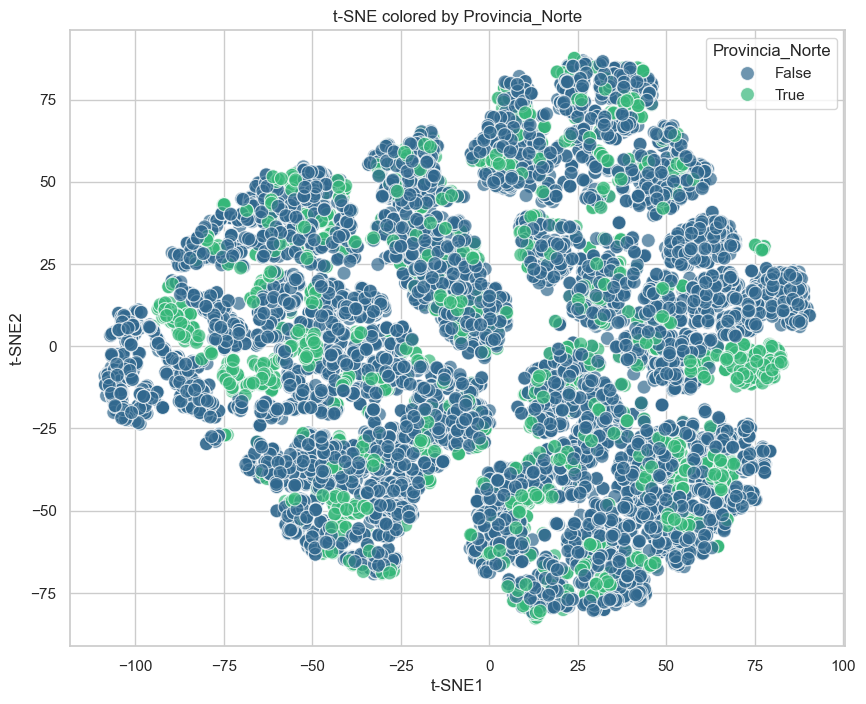

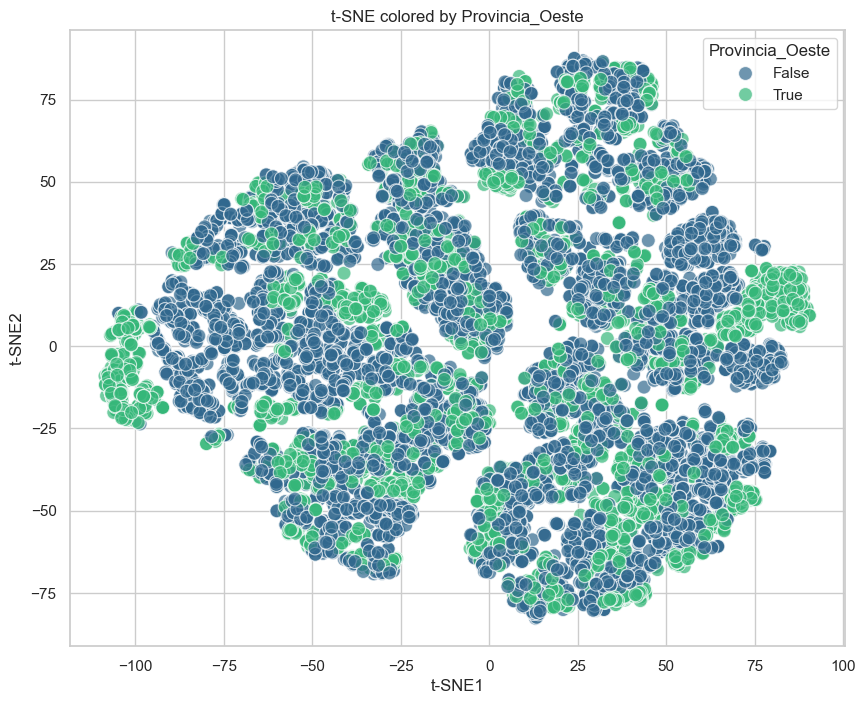

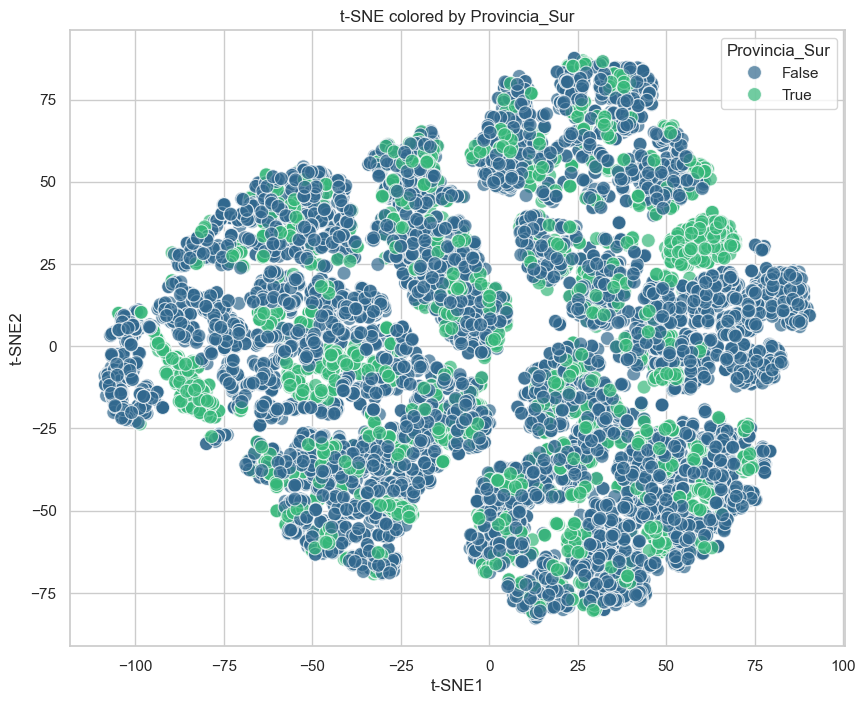

In [23]:
# ==============================
# 2. Visualize Trends with Key Variables
# ==============================
# Choose key variables to analyze (adjust this list as needed).
# For example, you might want to see trends for variables like "Edad", "Ingresos_anuales_brutos", and "socioeconomic_index".
key_variables = ['Edad', 'Ingresos_anuales_brutos', 'Generacion','Provincia_Este','Provincia_Norte','Provincia_Oeste','Provincia_Sur']

# Since t-SNE was computed on the scaled data (X_scaled), and key variable values may be in the original scale,
# we join the relevant columns from processed_df. (Ensure processed_df's rows align with X_scaled.)
# If processed_df is in the same row order as X_scaled, you can simply join on index.
for var in key_variables:
    if var in processed_df.columns:
        # Create a temporary DataFrame joining t-SNE results and the key variable
        temp_df = tsne_df.copy()
        temp_df[var] = processed_df[var].values
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x="tSNE1", y="tSNE2", hue=var, data=temp_df, palette="viridis", s=100, alpha=0.7)
        plt.title(f"t-SNE colored by {var}")
        plt.xlabel("t-SNE1")
        plt.ylabel("t-SNE2")
        plt.grid(True)
        plt.show()
    else:
        print(f"Variable {var} not found in processed_df.")

Continuous columns: ['Gastoscore', 'Experiencia_laboral', 'Generacion', 'Edad', 'Family_Size', 'Ingresos_anuales_brutos', 'Dias_cliente', 'per_capita_income', 'client_longevity', 'socioeconomic_index', 'Cluster']
Binary columns: ['Genero', 'Casado', 'Graduado', 'Profesion_Artista', 'Profesion_Construccion', 'Profesion_Ejecutivo', 'Profesion_Funcionario', 'Profesion_Ingeniero', 'Profesion_Medico', 'Profesion_Negocios/empresa', 'Profesion_Otros', 'Profesion_Servicios', 'Provincia_Este', 'Provincia_Norte', 'Provincia_Oeste', 'Provincia_Sur', 'marital_education_interaction']


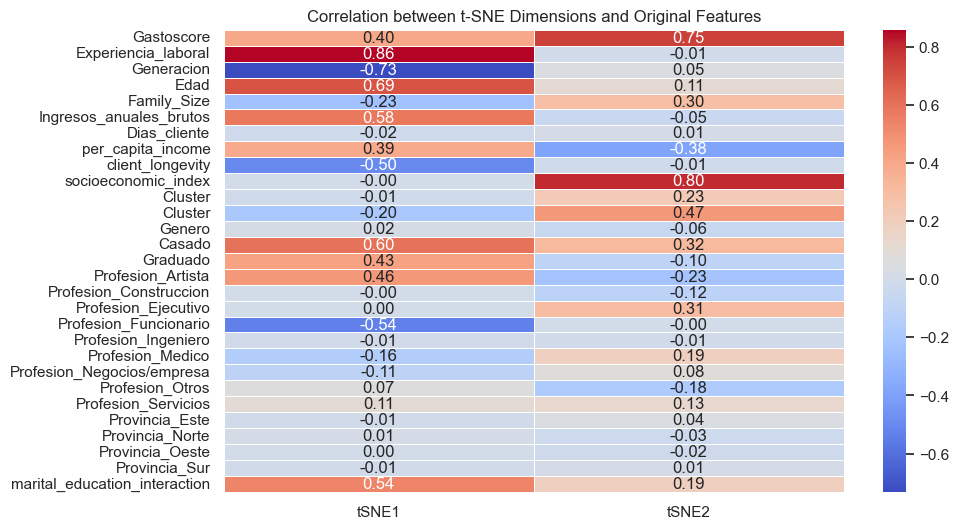

In [24]:
# ==============================
# 3. Correlation between t-SNE Dimensions and Original Variables
# ==============================
# Identify continuous and binary columns from processed_df.
binary_cols = []
continuous_cols = []
for col in processed_df.columns:
    unique_vals = processed_df[col].dropna().unique()
    if processed_df[col].dtype == bool or (len(unique_vals) <= 2 and set(unique_vals).issubset({0, 1})):
        binary_cols.append(col)
    else:
        continuous_cols.append(col)

print("Continuous columns:", continuous_cols)
print("Binary columns:", binary_cols)

# Concatenate t-SNE DataFrame with the columns of interest from processed_df.
df_tsne_corr = pd.concat([tsne_df, processed_df[continuous_cols + binary_cols].reset_index(drop=True)], axis=1)

# Compute correlation between t-SNE dimensions and original features.
corr_matrix = df_tsne_corr.corr().loc[continuous_cols + binary_cols, ['tSNE1', 'tSNE2']]
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation between t-SNE Dimensions and Original Features")
plt.show()

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_60361/906062183.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importance_df, x="Importance", y="Variable", palette="coolwarm")


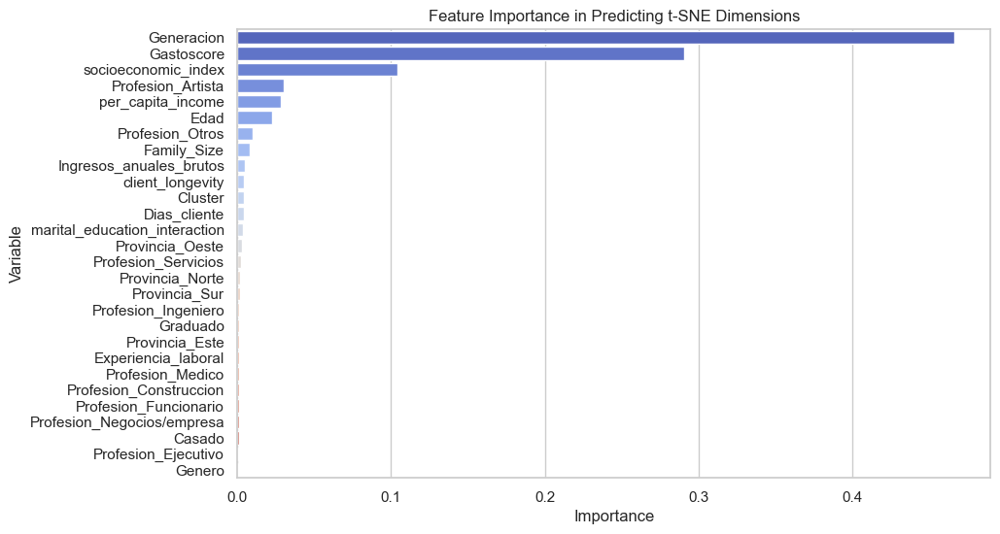

In [25]:
# ==============================
# 4. Feature Importance via Decision Tree Regressor
# ==============================
# Use the original processed features (continuous and binary) to predict the t-SNE coordinates.
X = processed_df[continuous_cols + binary_cols]
y_tsne1 = tsne_df["tSNE1"]
y_tsne2 = tsne_df["tSNE2"]

# Train Decision Tree Regressors for t-SNE1 and t-SNE2.
model1 = DecisionTreeRegressor(random_state=42).fit(X, y_tsne1)
model2 = DecisionTreeRegressor(random_state=42).fit(X, y_tsne2)

# Compute average feature importance from both models.
feature_importance = (model1.feature_importances_ + model2.feature_importances_) / 2
importance_df = pd.DataFrame({"Variable": X.columns, "Importance": feature_importance})
importance_df = importance_df.sort_values(by="Importance", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=importance_df, x="Importance", y="Variable", palette="coolwarm")
plt.title("Feature Importance in Predicting t-SNE Dimensions")
plt.show()

# Pairplot

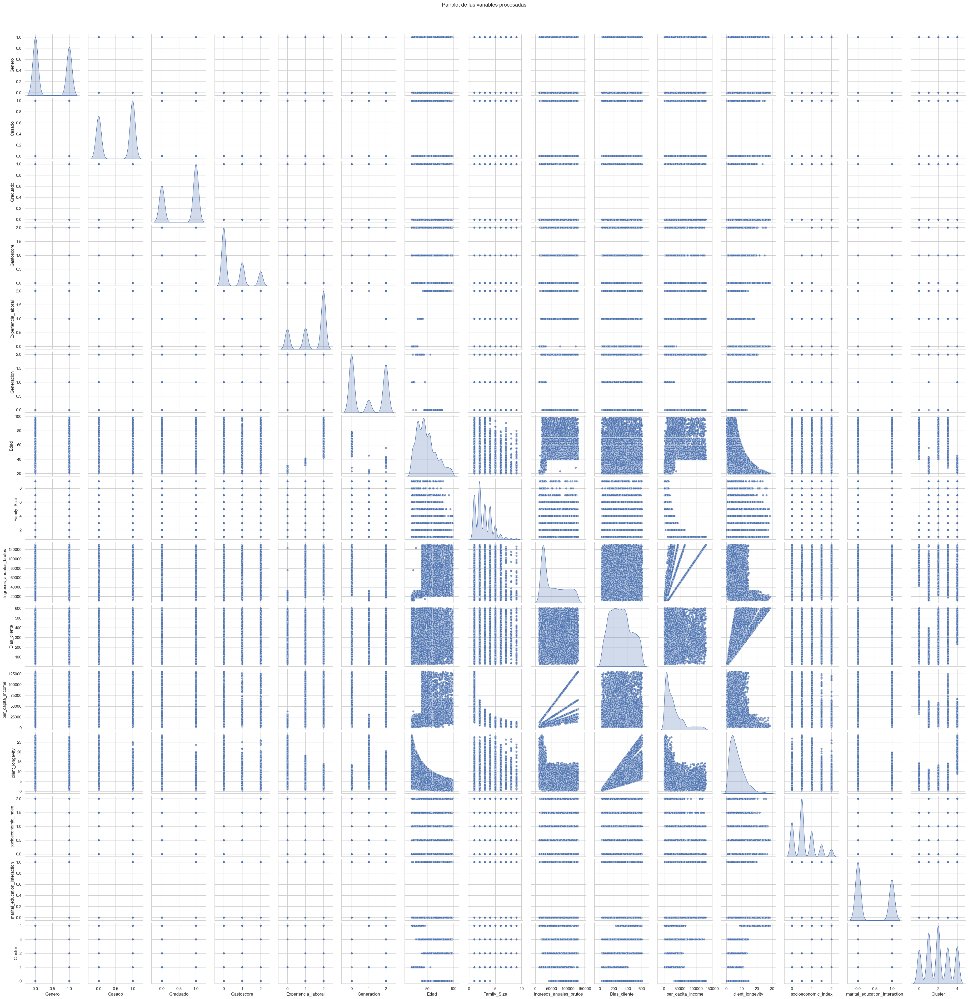

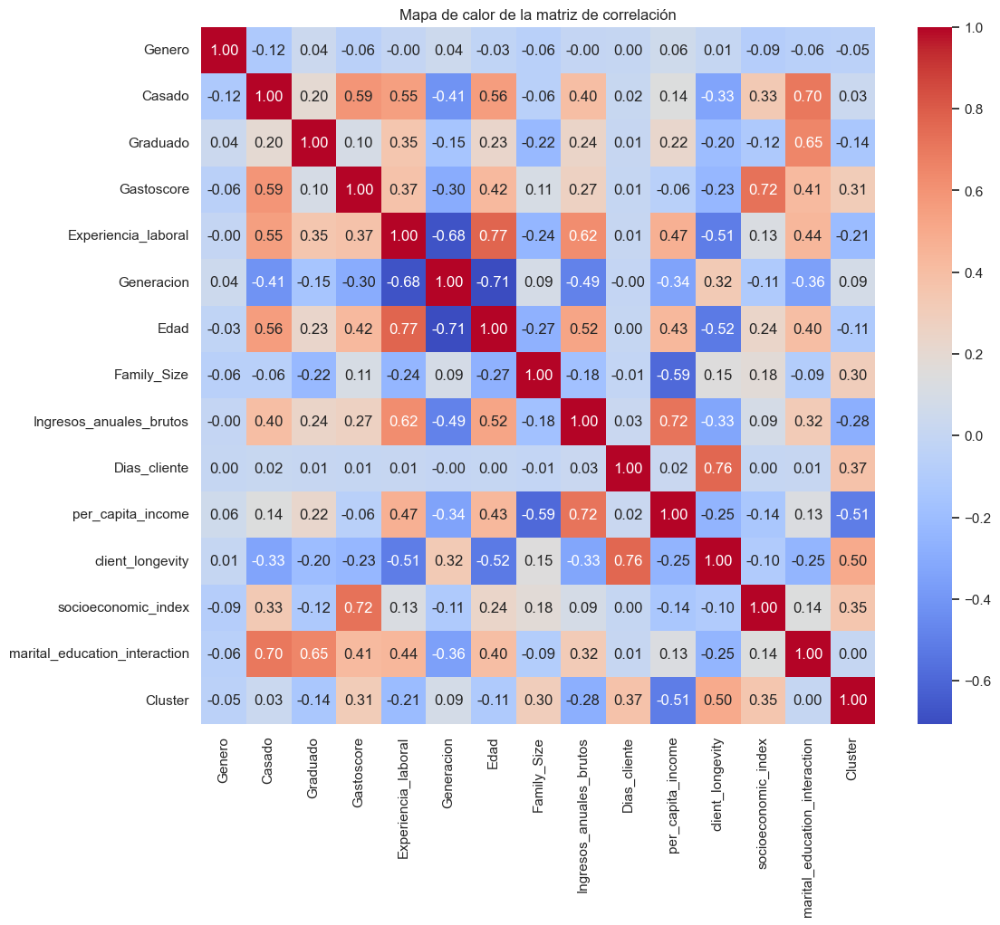

In [26]:
# Supongamos que 'processed_df' es el DataFrame con tus variables preprocesadas y codificadas.
# Para no saturar la visualización si tienes muchas variables, puedes elegir un subconjunto de las más relevantes:
subset = processed_df.select_dtypes(include=[np.number]).copy()  # Solo numéricas

# Pairplot:
sns.pairplot(subset, diag_kind='kde', plot_kws={'alpha': 0.7})
plt.suptitle('Pairplot de las variables procesadas', y=1.02)
plt.show()

# Heatmap de correlaciones:
plt.figure(figsize=(12, 10))
correlation_matrix = subset.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Mapa de calor de la matriz de correlación')
plt.show()

# Investigamos los cluster <3

In [27]:
# Agregar la columna de clusters al DataFrame procesado
df_clustered = processed_df.copy()
df_clustered['Cluster'] = clusters

In [28]:
# Estadísticas descriptivas para variables numéricas
cluster_stats = df_clustered.groupby('Cluster').agg(['mean', 'median', 'std'])
print("Estadísticas descriptivas para cada cluster:")
print(cluster_stats)

Estadísticas descriptivas para cada cluster:
           Genero                     Casado                   Graduado  \
             mean median       std      mean median       std      mean   
Cluster                                                                   
0        0.488827    0.0  0.499975  0.565443    1.0  0.495798  0.751796   
1        0.444297    0.0  0.496997  0.515473    1.0  0.499871  0.535809   
2        0.405707    0.0  0.491181  0.976427    1.0  0.151762  0.652605   
3        0.478047    0.0  0.499612  0.123391    0.0  0.328948  0.418244   
4        0.423206    0.0  0.494206  0.971973    1.0  0.165096  0.775785   

                         Gastoscore  ... per_capita_income client_longevity  \
        median       std       mean  ...               std             mean   
Cluster                              ...                                      
0          1.0  0.432057   0.007582  ...      34151.085608         5.224815   
1          1.0  0.498826   0.575597  .

In [29]:
# Ejemplo: Estadísticas de 'Edad' por cluster
edad_stats = df_clustered.groupby('Cluster')['Edad'].agg(['mean', 'median', 'std'])
print("Estadísticas de Edad por Cluster:")
print(edad_stats)

Estadísticas de Edad por Cluster:
              mean  median        std
Cluster                              
0        58.870710    54.0  15.356367
1        34.572502    34.0   5.750742
2        68.244417    67.0  15.574927
3        30.386828    30.0   6.884580
4        57.064462    55.0   9.434177


In [36]:
# Ejemplo: Distribución de 'Genero' por cluster (suponiendo que se conservaron o se tienen las categorías originales)
distribucion_genero = df_clustered.groupby('Cluster')['Genero'].value_counts(normalize=True).unstack()
print("Distribución de Genero por Cluster:")
print(distribucion_genero)

Distribución de Genero por Cluster:
Genero          0         1
Cluster                    
0        0.511173  0.488827
1        0.555703  0.444297
2        0.594293  0.405707
3        0.521953  0.478047
4        0.576794  0.423206


# Cluster defintion

In [31]:
import pandas as pd
import numpy as np

# Ensure that the "Cluster" column exists in processed_df.
if "Cluster" not in processed_df.columns:
    print("Error: 'Cluster' column not found in processed_df. Please run your clustering algorithm first.")
else:
    # Get a list of numeric columns, and remove the 'Cluster' column from that list.
    num_cols = processed_df.select_dtypes(include=[np.number]).columns.tolist()
    if "Cluster" in num_cols:
        num_cols.remove("Cluster")

    # Compute the overall mean for each numeric variable.
    overall_means = processed_df[num_cols].mean()
    
    # Compute the mean value for each variable within each cluster.
    cluster_means = processed_df.groupby("Cluster")[num_cols].mean()
    
    # Calculate the ratio of the cluster mean to the overall mean for each variable.
    # This creates a DataFrame where each row is a variable and each column is a cluster.
    ratio_df = cluster_means.divide(overall_means, axis=1)
    
    # Transpose the DataFrame if you want clusters as columns and variables as rows.
    # (Each cell indicates by what factor the mean of the variable in that cluster is 
    #  relative to the overall mean.)
    ratio_df = ratio_df.T
    
    # Optionally, round the ratios for better readability.
    ratio_df = ratio_df.round(2)
    
    print("Table of Mean Ratios (Cluster Mean / Overall Mean):")
    print(ratio_df)
    
    # If you prefer, you can also save the table as a CSV:
    # ratio_df.to_csv("cluster_mean_ratios.csv")

Table of Mean Ratios (Cluster Mean / Overall Mean):
Cluster                           0     1     2     3     4
Genero                         1.12  1.06  0.96  0.86  1.01
Casado                         0.96  0.46  1.47  1.70  0.36
Graduado                       1.27  0.77  1.24  1.05  0.64
Gastoscore                     0.19  0.36  1.02  3.36  0.28
Experiencia_laboral            1.38  0.45  1.45  1.40  0.32
Generacion                     0.50  1.99  0.11  0.35  1.83
Edad                           1.20  0.67  1.19  1.35  0.63
Family_Size                    0.46  1.12  1.04  1.07  1.20
Ingresos_anuales_brutos        1.71  0.50  1.17  1.32  0.47
Dias_cliente                   1.03  0.64  0.99  1.00  1.48
per_capita_income              2.76  0.42  0.88  1.00  0.38
client_longevity               0.80  0.83  0.75  0.69  2.10
socioeconomic_index            0.47  0.80  0.71  2.42  0.83
marital_education_interaction  1.01  0.39  1.60  1.60  0.30


In [32]:
import pandas as pd
import numpy as np

# --- Step 1: Load your processed DataFrame ---
# Uncomment and update the next line if you haven't loaded your data already.
# processed_df = pd.read_csv("processed_df(10).csv")

# Make sure your processed_df has a 'Cluster' column added from your clustering.
if "Cluster" not in processed_df.columns:
    raise ValueError("The processed_df does not have a 'Cluster' column. Please run your clustering algorithm first.")

# --- Step 2: Identify all numeric columns (including dummy variables) ---
num_cols = processed_df.select_dtypes(include=[np.number]).columns.tolist()
if "Cluster" in num_cols:
    num_cols.remove("Cluster")  # We don't want to include the cluster label in the ratio calculation.

# --- Step 3: Compute overall means and cluster-wise means for each numeric variable ---
overall_means = processed_df[num_cols].mean()
cluster_means = processed_df.groupby("Cluster")[num_cols].mean()

# --- Step 4: Compute the ratio (cluster mean / overall mean) for each variable ---
ratio_df = cluster_means.divide(overall_means, axis=1)

# Round for better readability
ratio_df = ratio_df.round(2)

# --- Step 5: Transpose the table to have variables as rows and clusters as columns ---
# Now, each row corresponds to one variable and each column to one cluster.
ratio_df = ratio_df.transpose()

# Optionally, rename the columns for clarity
ratio_df.columns = [f"Cluster {col}" for col in ratio_df.columns]

# --- Step 6: Output the results ---
print("Relative Mean Ratios (Cluster Mean / Overall Mean) for all numeric variables:")
print(ratio_df)

# Optionally, save the table to a CSV file.
ratio_df.to_csv("cluster_relative_ratios.csv", index=True)

Relative Mean Ratios (Cluster Mean / Overall Mean) for all numeric variables:
                               Cluster 0  Cluster 1  Cluster 2  Cluster 3  \
Genero                              1.12       1.06       0.96       0.86   
Casado                              0.96       0.46       1.47       1.70   
Graduado                            1.27       0.77       1.24       1.05   
Gastoscore                          0.19       0.36       1.02       3.36   
Experiencia_laboral                 1.38       0.45       1.45       1.40   
Generacion                          0.50       1.99       0.11       0.35   
Edad                                1.20       0.67       1.19       1.35   
Family_Size                         0.46       1.12       1.04       1.07   
Ingresos_anuales_brutos             1.71       0.50       1.17       1.32   
Dias_cliente                        1.03       0.64       0.99       1.00   
per_capita_income                   2.76       0.42       0.88       1.00  

In [33]:
import pandas as pd
import numpy as np

# --- Step 1: Load your processed DataFrame ---
# For example, if loaded from CSV:
# processed_df = pd.read_csv("processed_df(10).csv")

# Ensure the DataFrame has a "Cluster" column. If not, raise an error.
if "Cluster" not in processed_df.columns:
    raise ValueError("The processed_df does not have a 'Cluster' column. Please run your clustering algorithm first.")

# --- Step 2: Convert Boolean columns to binary (integers) ---
bool_cols = processed_df.select_dtypes(include=['bool']).columns.tolist()
if bool_cols:
    print("Converting boolean columns to integers:", bool_cols)
    processed_df[bool_cols] = processed_df[bool_cols].astype(int)
else:
    print("No boolean columns detected.")

# --- Step 3: Identify all numeric columns for evaluation ---
# This should now include the converted dummy columns.
num_cols = processed_df.select_dtypes(include=[np.number]).columns.tolist()
if "Cluster" in num_cols:
    num_cols.remove("Cluster")  # Exclude the Cluster column

# --- Step 4: Compute the overall mean for each numeric variable ---
overall_means = processed_df[num_cols].mean()

# --- Step 5: Compute the mean for each numeric variable within each cluster ---
cluster_means = processed_df.groupby("Cluster")[num_cols].mean()

# --- Step 6: Compute the ratio of cluster mean to overall mean for each variable ---
ratio_df = cluster_means.divide(overall_means, axis=1)

# --- Step 7: Transpose the table so that rows are variables and columns are clusters ---
ratio_df = ratio_df.transpose()
ratio_df.columns = [f"Cluster {c}" for c in ratio_df.columns]

# --- Optional: Round the values for readability ---
ratio_df = ratio_df.round(2)

print("Relative Mean Ratios (Cluster Mean / Overall Mean) for All Numeric Variables:")
print(ratio_df)

# Optionally, save this table to CSV:
# ratio_df.to_csv("cluster_relative_ratios.csv", index=True)

Converting boolean columns to integers: ['Profesion_Artista', 'Profesion_Construccion', 'Profesion_Ejecutivo', 'Profesion_Funcionario', 'Profesion_Ingeniero', 'Profesion_Medico', 'Profesion_Negocios/empresa', 'Profesion_Otros', 'Profesion_Servicios', 'Provincia_Este', 'Provincia_Norte', 'Provincia_Oeste', 'Provincia_Sur']
Relative Mean Ratios (Cluster Mean / Overall Mean) for All Numeric Variables:
                               Cluster 0  Cluster 1  Cluster 2  Cluster 3  \
Genero                              1.12       1.06       0.96       0.86   
Casado                              0.96       0.46       1.47       1.70   
Graduado                            1.27       0.77       1.24       1.05   
Gastoscore                          0.19       0.36       1.02       3.36   
Experiencia_laboral                 1.38       0.45       1.45       1.40   
Profesion_Artista                   1.44       0.61       1.70       0.53   
Profesion_Construccion              1.06       1.60       0

In [35]:
import pandas as pd
import numpy as np

# --- Assume processed_df is already defined and includes the 'Cluster' column ---
if "Cluster" not in processed_df.columns:
    raise ValueError("The processed_df does not have a 'Cluster' column. Please run your clustering algorithm first.")

# ================================
# Part A: Export Customer-level Data
# ================================
# Export the entire processed_df (which includes all the client data along with the Cluster assignment)
customers_csv_filename = "customers_with_clusters.csv"
processed_df.to_csv(customers_csv_filename, index=False)
print(f"Customer-level data exported to '{customers_csv_filename}'.")

# =====================================
# Part B: Create and Export Cluster Dashboard Summary
# =====================================
# Identify all numeric columns, including dummy variables; ensure we include everything:
num_cols = processed_df.select_dtypes(include=[np.number]).columns.tolist()
if "Cluster" in num_cols:
    num_cols.remove("Cluster")  # Remove the Cluster label from our ratio calculations

# Compute the overall mean for each numeric variable
overall_means = processed_df[num_cols].mean()

# Compute the mean for each numeric variable within each cluster
cluster_means = processed_df.groupby("Cluster")[num_cols].mean()

# Calculate the ratio for each variable: Cluster_Mean / Overall_Mean
ratio_df = cluster_means.divide(overall_means, axis=1)

# Reshape the DataFrame to a long (tidy) format:
# Each row will be a variable within a cluster, with columns for the overall mean, cluster mean, and ratio.
ratio_long = ratio_df.stack().reset_index()
ratio_long.columns = ["Cluster", "Variable", "Ratio"]

cluster_means_long = cluster_means.stack().reset_index()
cluster_means_long.columns = ["Cluster", "Variable", "Cluster_Mean"]

overall_means_long = overall_means.reset_index()
overall_means_long.columns = ["Variable", "Overall_Mean"]

# Merge the three dataframes into one summary table
dashboard_df = pd.merge(ratio_long, cluster_means_long, on=["Cluster", "Variable"])
dashboard_df = pd.merge(dashboard_df, overall_means_long, on="Variable")

# Reorder the columns for clarity
dashboard_df = dashboard_df[["Cluster", "Variable", "Overall_Mean", "Cluster_Mean", "Ratio"]]

# Optionally, round the numbers for better readability
dashboard_df["Overall_Mean"] = dashboard_df["Overall_Mean"].round(2)
dashboard_df["Cluster_Mean"] = dashboard_df["Cluster_Mean"].round(2)
dashboard_df["Ratio"] = dashboard_df["Ratio"].round(2)

# Export the summary as a CSV file.
dashboard_csv_filename = "cluster_dashboard.csv"
dashboard_df.to_csv(dashboard_csv_filename, index=False)
print(f"Cluster dashboard summary exported to '{dashboard_csv_filename}'.")
print("\nSample cluster dashboard summary:")
print(dashboard_df.head(10))

Customer-level data exported to 'customers_with_clusters.csv'.
Cluster dashboard summary exported to 'cluster_dashboard.csv'.

Sample cluster dashboard summary:
   Cluster                Variable  Overall_Mean  Cluster_Mean  Ratio
0        0                  Genero          0.45          0.51   1.12
1        0                  Casado          0.58          0.55   0.96
2        0                Graduado          0.61          0.78   1.27
3        0              Gastoscore          0.54          0.10   0.19
4        0     Experiencia_laboral          1.38          1.91   1.38
5        0       Profesion_Artista          0.31          0.45   1.44
6        0  Profesion_Construccion          0.03          0.03   1.06
7        0     Profesion_Ejecutivo          0.07          0.02   0.32
8        0   Profesion_Funcionario          0.16          0.03   0.17
9        0     Profesion_Ingeniero          0.09          0.10   1.11
